In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
initial_values = {
    'HEB': 9,
    'BEB': 15
}

In [4]:
h_pp = pd.read_csv(r'../../results/highcap-PP-optimized-variables-with-replacement-y.csv', low_memory=False)

# Drop CDBs
h_pp = h_pp.loc[h_pp['Powertrain'] != 'CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_pp.loc[(h_pp['Year'] == 0) & (h_pp['Powertrain'] == 'HEB'), 'Value'] = 9
h_pp.loc[(h_pp['Year'] == 0) & (h_pp['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_pp['Diff'] = h_pp.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_pp['Diff'] = h_pp['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_pp['Investment Cost (M$)'] = h_pp.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_h_pp = h_pp.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_h_pp.columns = [f'{col[1]} - {col[0]}' for col in result_h_pp.columns]
result_h_pp

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,23,9,8.0,0.0,10.4,0.0
2,2,23,25,0.0,16.0,0.0,14.4
3,3,27,35,4.0,10.0,5.2,9.0
4,4,38,35,11.0,0.0,14.3,0.0
5,5,42,39,4.0,4.0,5.2,3.6
6,6,52,39,10.0,0.0,13.0,0.0
7,7,55,42,3.0,3.0,3.9,2.7
8,8,58,45,3.0,3.0,3.9,2.7
9,9,61,48,3.0,3.0,3.9,2.7


In [5]:
h_FE = pd.read_csv(r'../../results/highcap-FE-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
# Drop CDBs
h_FE = h_FE.loc[h_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_FE.loc[(h_FE['Year'] == 0) & (h_FE['Powertrain'] == 'HEB'), 'Value'] = 9
h_FE.loc[(h_FE['Year'] == 0) & (h_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_FE['Diff'] = h_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_FE['Diff'] = h_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_FE['Investment Cost (M$)'] = h_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_h_FE = h_FE.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_h_FE.columns = [f'{col[1]} - {col[0]}' for col in result_h_FE.columns]
result_h_FE

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,23,9,8.0,0.0,10.4,0.0
2,2,23,9,0.0,0.0,0.0,0.0
3,3,27,9,4.0,0.0,5.2,0.0
4,4,38,9,11.0,0.0,14.3,0.0
5,5,42,9,4.0,0.0,5.2,0.0
6,6,52,9,10.0,0.0,13.0,0.0
7,7,73,9,21.0,0.0,27.3,0.0
8,8,96,9,23.0,0.0,29.9,0.0
9,9,119,9,23.0,0.0,29.9,0.0


In [6]:
m_FE = pd.read_csv(r'../../results/midcap-FE-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
# Drop CDBs
m_FE = m_FE.loc[m_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_FE.loc[(m_FE['Year'] == 0) & (m_FE['Powertrain'] == 'HEB'), 'Value'] = 9
m_FE.loc[(m_FE['Year'] == 0) & (m_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_FE['Diff'] = m_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_FE['Diff'] = m_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_FE['Investment Cost (M$)'] = m_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_m_FE = m_FE.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_m_FE.columns = [f'{col[1]} - {col[0]}' for col in result_m_FE.columns]
result_m_FE

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,23,9,8.0,0.0,10.4,0.0
2,2,23,9,0.0,0.0,0.0,0.0
3,3,27,9,4.0,0.0,5.2,0.0
4,4,38,9,11.0,0.0,14.3,0.0
5,5,42,9,4.0,0.0,5.2,0.0
6,6,52,9,10.0,0.0,13.0,0.0
7,7,67,9,15.0,0.0,19.5,0.0
8,8,82,9,15.0,0.0,19.5,0.0
9,9,97,9,15.0,0.0,19.5,0.0


In [7]:
l_FE = pd.read_csv(r'../../results/lowcap-FE-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
# Drop CDBs
l_FE = l_FE.loc[l_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_FE.loc[(l_FE['Year'] == 0) & (l_FE['Powertrain'] == 'HEB'), 'Value'] = 9
l_FE.loc[(l_FE['Year'] == 0) & (l_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_FE['Diff'] = l_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_FE['Diff'] = l_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_FE['Investment Cost (M$)'] = l_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_l_FE = l_FE.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_l_FE.columns = [f'{col[1]} - {col[0]}' for col in result_l_FE.columns]
result_l_FE

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,22,9,7.0,0.0,9.1,0.0
2,2,23,9,1.0,0.0,1.3,0.0
3,3,27,9,4.0,0.0,5.2,0.0
4,4,34,9,7.0,0.0,9.1,0.0
5,5,41,9,7.0,0.0,9.1,0.0
6,6,48,9,7.0,0.0,9.1,0.0
7,7,55,9,7.0,0.0,9.1,0.0
8,8,62,9,7.0,0.0,9.1,0.0
9,9,69,9,7.0,0.0,9.1,0.0


In [8]:
h_FH = pd.read_csv(r'../../results/highcap-FH-optimized-variables-with-replacement-y.csv', low_memory=False)
# Drop CDBs
h_FH = h_FH.loc[h_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_FH.loc[(h_FH['Year'] == 0) & (h_FH['Powertrain'] == 'HEB'), 'Value'] = 9
h_FH.loc[(h_FH['Year'] == 0) & (h_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_FH['Diff'] = h_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_FH['Diff'] = h_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_FH['Investment Cost (M$)'] = h_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_h_FH = h_FH.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_h_FH.columns = [f'{col[1]} - {col[0]}' for col in result_h_FH.columns]
result_h_FH

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,15,42,0.0,33.0,0.0,29.7
2,2,15,75,0.0,33.0,0.0,29.7
3,3,15,108,0.0,33.0,0.0,29.7
4,4,15,119,0.0,11.0,0.0,9.9
5,5,15,119,0.0,0.0,0.0,0.0
6,6,15,119,0.0,0.0,0.0,0.0
7,7,15,119,0.0,0.0,0.0,0.0
8,8,15,119,0.0,0.0,0.0,0.0
9,9,15,119,0.0,0.0,0.0,0.0


In [9]:
m_FH = pd.read_csv(r'../../results/midcap-FH-optimized-variables-with-replacement-y.csv', low_memory=False)
# Drop CDBs
m_FH = m_FH.loc[m_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_FH.loc[(m_FH['Year'] == 0) & (m_FH['Powertrain'] == 'HEB'), 'Value'] = 9
m_FH.loc[(m_FH['Year'] == 0) & (m_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_FH['Diff'] = m_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_FH['Diff'] = m_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_FH['Investment Cost (M$)'] = m_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_m_FH = m_FH.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_m_FH.columns = [f'{col[1]} - {col[0]}' for col in result_m_FH.columns]
result_m_FH

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,15,31,0.0,22.0,0.0,19.8
2,2,15,53,0.0,22.0,0.0,19.8
3,3,15,75,0.0,22.0,0.0,19.8
4,4,15,97,0.0,22.0,0.0,19.8
5,5,15,119,0.0,22.0,0.0,19.8
6,6,15,119,0.0,0.0,0.0,0.0
7,7,15,119,0.0,0.0,0.0,0.0
8,8,15,119,0.0,0.0,0.0,0.0
9,9,15,119,0.0,0.0,0.0,0.0


In [10]:
l_FH = pd.read_csv(r'../../results/lowcap-FH-optimized-variables-with-replacement-y.csv', low_memory=False)
# Drop CDBs
l_FH = l_FH.loc[l_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_FH.loc[(l_FH['Year'] == 0) & (l_FH['Powertrain'] == 'HEB'), 'Value'] = 9
l_FH.loc[(l_FH['Year'] == 0) & (l_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_FH['Diff'] = l_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_FH['Diff'] = l_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_FH['Investment Cost (M$)'] = l_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_l_FH = l_FH.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_l_FH.columns = [f'{col[1]} - {col[0]}' for col in result_l_FH.columns]
result_l_FH

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,15,20,0.0,11.0,0.0,9.9
2,2,15,31,0.0,11.0,0.0,9.9
3,3,15,42,0.0,11.0,0.0,9.9
4,4,15,53,0.0,11.0,0.0,9.9
5,5,15,64,0.0,11.0,0.0,9.9
6,6,15,75,0.0,11.0,0.0,9.9
7,7,15,86,0.0,11.0,0.0,9.9
8,8,15,97,0.0,11.0,0.0,9.9
9,9,15,108,0.0,11.0,0.0,9.9


In [11]:
h_BM = pd.read_csv(r'../../results/highcap-BM-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
# Drop CDBs
h_BM = h_BM.loc[h_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_BM.loc[(h_BM['Year'] == 0) & (h_BM['Powertrain'] == 'HEB'), 'Value'] = 9
h_BM.loc[(h_BM['Year'] == 0) & (h_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_BM['Diff'] = h_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_BM['Diff'] = h_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_BM['Investment Cost (M$)'] = h_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_h_BM = h_BM.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_h_BM.columns = [f'{col[1]} - {col[0]}' for col in result_h_BM.columns]
result_h_BM

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,20,35,5.0,26.0,6.5,23.4
2,2,23,64,3.0,29.0,3.9,26.1
3,3,27,91,4.0,27.0,5.2,24.3
4,4,38,108,11.0,17.0,14.3,15.3
5,5,42,107,4.0,0.0,5.2,0.0
6,6,52,103,10.0,0.0,13.0,0.0
7,7,73,93,21.0,0.0,27.3,0.0
8,8,96,83,23.0,0.0,29.9,0.0
9,9,119,72,23.0,0.0,29.9,0.0


In [12]:
m_BM = pd.read_csv(r'../../results/midcap-BM-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
# Drop CDBs
m_BM = m_BM.loc[m_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_BM.loc[(m_BM['Year'] == 0) & (m_BM['Powertrain'] == 'HEB'), 'Value'] = 9
m_BM.loc[(m_BM['Year'] == 0) & (m_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_BM['Diff'] = m_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_BM['Diff'] = m_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_BM['Investment Cost (M$)'] = m_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_m_BM = m_BM.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_m_BM.columns = [f'{col[1]} - {col[0]}' for col in result_m_BM.columns]
result_m_BM

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,22,21,7.0,12.0,9.1,10.8
2,2,22,43,0.0,22.0,0.0,19.8
3,3,27,58,5.0,15.0,6.5,13.5
4,4,38,64,11.0,6.0,14.3,5.4
5,5,42,80,4.0,16.0,5.2,14.4
6,6,52,87,10.0,7.0,13.0,6.3
7,7,67,87,15.0,0.0,19.5,0.0
8,8,82,87,15.0,0.0,19.5,0.0
9,9,97,82,15.0,0.0,19.5,0.0


In [13]:
l_BM = pd.read_csv(r'../../results/lowcap-BM-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
# Drop CDBs
l_BM = l_BM.loc[l_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_BM.loc[(l_BM['Year'] == 0) & (l_BM['Powertrain'] == 'HEB'), 'Value'] = 9
l_BM.loc[(l_BM['Year'] == 0) & (l_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_BM['Diff'] = l_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_BM['Diff'] = l_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_BM['Investment Cost (M$)'] = l_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

# Group by 'Year' and 'Powertrain', and sum the 'Value', 'Diff', and 'Investment Cost (M$)' for each group
result_l_BM = l_BM.groupby(['Year', 'Powertrain'])[['Value', 'Diff', 'Investment Cost (M$)']].sum().unstack().fillna(0).reset_index()
result_l_BM.columns = [f'{col[1]} - {col[0]}' for col in result_l_BM.columns]
result_l_BM

,- Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$)
0,0,15,9,0.0,0.0,0.0,0.0
1,1,22,10,7.0,1.0,9.1,0.9
2,2,22,21,0.0,11.0,0.0,9.9
3,3,26,26,4.0,5.0,5.2,4.5
4,4,33,27,7.0,1.0,9.1,0.9
5,5,40,28,7.0,1.0,9.1,0.9
6,6,47,29,7.0,1.0,9.1,0.9
7,7,54,30,7.0,1.0,9.1,0.9
8,8,61,31,7.0,1.0,9.1,0.9
9,9,68,32,7.0,1.0,9.1,0.9


In [14]:
# Group by 'Year' and sum 'Investment Cost (M$)'
result_h_pp['future'] = 'PVTA plan'
result_h_FE['future'] = 'hi-cap Electric'
result_m_FE['future'] = 'mid-cap Electric'
result_l_FE['future'] = 'lo-cap Electric'
result_h_FH['future'] = 'hi-cap Hybrid'
result_m_FH['future'] = 'mid-cap Hybrid'
result_l_FH['future'] = 'lo-cap Hybrid'
result_h_BM['future'] = 'hi-cap Hybrid Electric'
result_m_BM['future'] = 'mid-cap Hybrid Electric'
result_l_BM['future'] = 'lo-cap Hybrid Electric'

In [15]:
# Define a custom palette and marker order
custom_palette = {
    "Status quo": "black",
    "PVTA plan": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Status quo": "P",
    "PVTA plan": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}


# Merge dataframes
dataframes = [result_h_pp, result_h_FE, result_m_FE, result_l_FE, result_h_FH, result_m_FH, result_l_FH, result_h_BM, result_m_BM, result_l_BM]  # Add all your dataframes in this list
merged_df = pd.concat(dataframes, ignore_index=True)

merged_df = merged_df.rename(columns={' - Year': 'Year'})
print(merged_df.columns)

# Creating a mapping dictionary
year_mapping = {i: 2022 + i for i in range(14)}

# Replacing the values in the "Year" column based on the mapping dictionary
merged_df['Year'] = merged_df['Year'].replace(year_mapping)

Index(['Year', 'BEB - Value', 'HEB - Value', 'BEB - Diff', 'HEB - Diff',
       'BEB - Investment Cost (M$)', 'HEB - Investment Cost (M$)', 'future'],
      dtype='object')


In [16]:
merged_df['yearly_purchased_buses']=merged_df['BEB - Diff']+ merged_df['HEB - Diff']

In [17]:
merged_df

,Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$),future,yearly_purchased_buses
0,2022,15,9,0.0,0.0,0.0,0.0,PVTA plan,0.0
1,2023,23,9,8.0,0.0,10.4,0.0,PVTA plan,8.0
2,2024,23,25,0.0,16.0,0.0,14.4,PVTA plan,16.0
3,2025,27,35,4.0,10.0,5.2,9.0,PVTA plan,14.0
4,2026,38,35,11.0,0.0,14.3,0.0,PVTA plan,11.0
...,...,...,...,...,...,...,...,...,...
135,2031,68,32,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0
136,2032,75,33,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0
137,2033,82,34,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0
138,2034,89,35,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1761405299.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hi_cap_hybrid_electric['Remaining Investment (M$)'] = total_investment - (


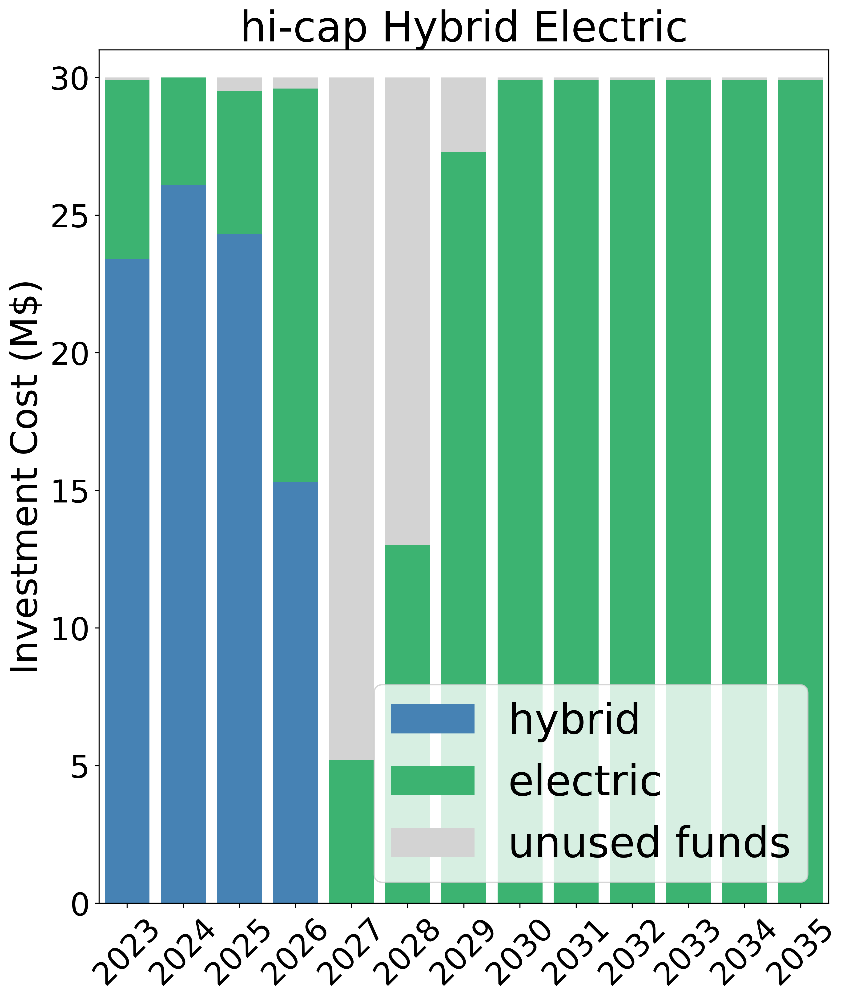

In [18]:
# Define the color palette
palette = {
    'HEB': 'steelblue',
    'BEB': 'mediumseagreen',
    'Remaining': 'lightgray'  # Color for the remaining investment
}

# Filter the dataframe for 'hi-cap Hybrid Electric' future
hi_cap_hybrid_electric = merged_df.loc[merged_df['future'] == 'hi-cap Hybrid Electric']

# Calculate remaining investment
total_investment = 30  # Total investment in millions of dollars
hi_cap_hybrid_electric['Remaining Investment (M$)'] = total_investment - (
    hi_cap_hybrid_electric['HEB - Investment Cost (M$)'] + hi_cap_hybrid_electric['BEB - Investment Cost (M$)'])

# Create a stacked bar plot
plt.figure(figsize=(10, 12), dpi=400)
plt.bar(hi_cap_hybrid_electric['Year'], hi_cap_hybrid_electric['HEB - Investment Cost (M$)'],
        color=palette['HEB'], label='hybrid')

plt.bar(hi_cap_hybrid_electric['Year'], hi_cap_hybrid_electric['BEB - Investment Cost (M$)'],
        bottom=hi_cap_hybrid_electric['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='electric')

# Adding the remaining investment
plt.bar(hi_cap_hybrid_electric['Year'], hi_cap_hybrid_electric['Remaining Investment (M$)'],
        bottom=hi_cap_hybrid_electric['HEB - Investment Cost (M$)'] + hi_cap_hybrid_electric['BEB - Investment Cost (M$)'],
        color=palette['Remaining'], label='unused funds')

plt.xticks(hi_cap_hybrid_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)


# Adding labels and title
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('hi-cap Hybrid Electric', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [19]:
hi_cap_hybrid_electric['total_cost']=hi_cap_hybrid_electric['BEB - Investment Cost (M$)']+hi_cap_hybrid_electric['HEB - Investment Cost (M$)']
print('hi_cap_hybrid_electric_total_cost:',hi_cap_hybrid_electric['total_cost'].sum())

hi_cap_hybrid_electric_total_cost: 343.9


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\2726631405.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hi_cap_hybrid_electric['total_cost']=hi_cap_hybrid_electric['BEB - Investment Cost (M$)']+hi_cap_hybrid_electric['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\3206085328.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_cap_hybrid_electric['Remaining Investment (M$)'] = total_investment - (


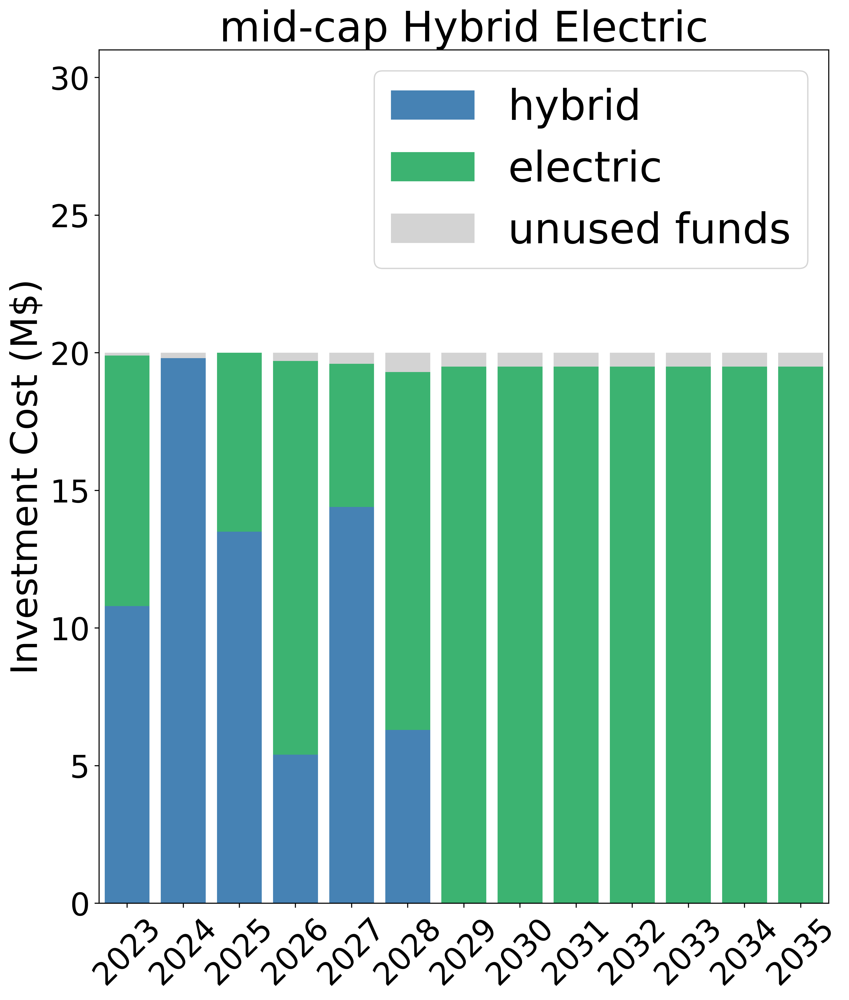

In [20]:
# Filter the dataframe 
mid_cap_hybrid_electric = merged_df.loc[merged_df['future'] == 'mid-cap Hybrid Electric']

# Calculate remaining investment
total_investment = 20  # Total investment in millions of dollars
mid_cap_hybrid_electric['Remaining Investment (M$)'] = total_investment - (
    mid_cap_hybrid_electric['HEB - Investment Cost (M$)'] + mid_cap_hybrid_electric['BEB - Investment Cost (M$)'])

# Create a stacked bar plot
plt.figure(figsize=(10, 12), dpi=400)
plt.bar(mid_cap_hybrid_electric['Year'], mid_cap_hybrid_electric['HEB - Investment Cost (M$)'],
        color=palette['HEB'], label='hybrid')

plt.bar(mid_cap_hybrid_electric['Year'], mid_cap_hybrid_electric['BEB - Investment Cost (M$)'],
        bottom=mid_cap_hybrid_electric['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='electric')

# Adding the remaining investment
plt.bar(mid_cap_hybrid_electric['Year'], mid_cap_hybrid_electric['Remaining Investment (M$)'],
        bottom=mid_cap_hybrid_electric['HEB - Investment Cost (M$)'] + mid_cap_hybrid_electric['BEB - Investment Cost (M$)'],
        color=palette['Remaining'], label='unused funds')

plt.xticks(mid_cap_hybrid_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)

# Adding labels and title
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('mid-cap Hybrid Electric', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [21]:
mid_cap_hybrid_electric['total_cost']=mid_cap_hybrid_electric['BEB - Investment Cost (M$)']+mid_cap_hybrid_electric['HEB - Investment Cost (M$)']
print('mid_cap_hybrid_electric_total_cost:',mid_cap_hybrid_electric['total_cost'].sum())

mid_cap_hybrid_electric_total_cost: 254.79999999999998


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1719300876.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_cap_hybrid_electric['total_cost']=mid_cap_hybrid_electric['BEB - Investment Cost (M$)']+mid_cap_hybrid_electric['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1608460165.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lo_cap_hybrid_electric['Remaining Investment (M$)'] = total_investment - (


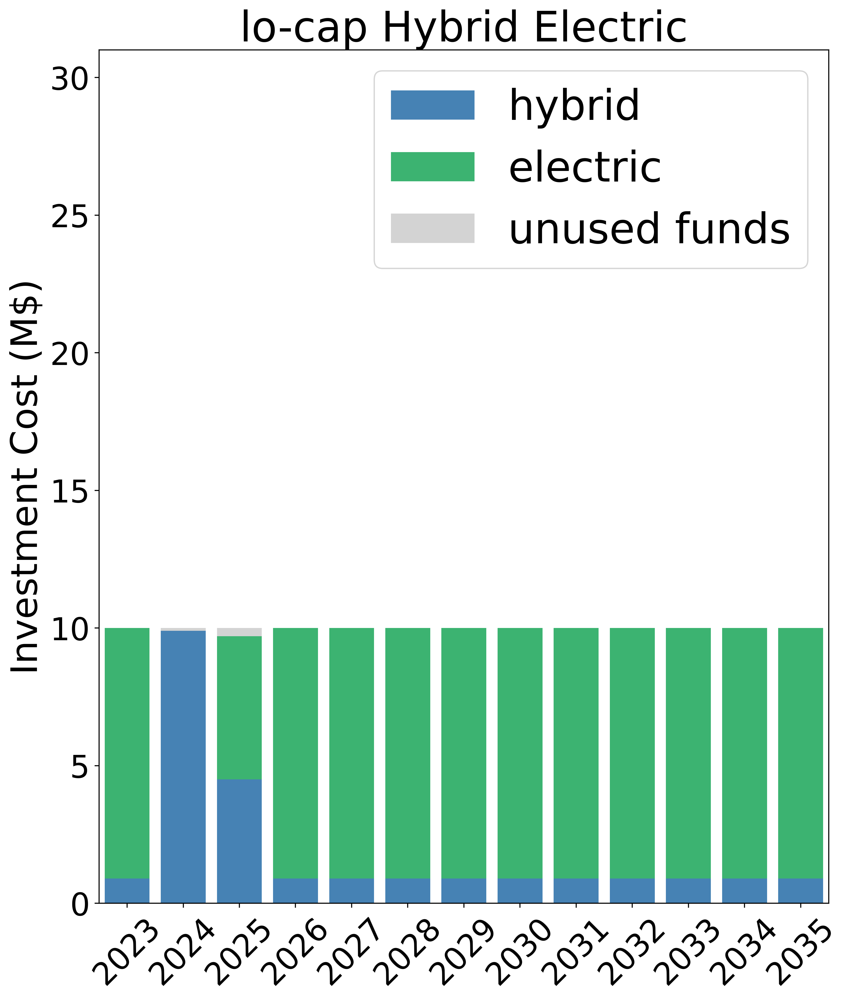

In [22]:
# Filter the dataframe 
lo_cap_hybrid_electric = merged_df.loc[merged_df['future'] == 'lo-cap Hybrid Electric']

# Calculate remaining investment
total_investment = 10  # Total investment in millions of dollars
lo_cap_hybrid_electric['Remaining Investment (M$)'] = total_investment - (
    lo_cap_hybrid_electric['HEB - Investment Cost (M$)'] + lo_cap_hybrid_electric['BEB - Investment Cost (M$)'])

# Create a stacked bar plot
plt.figure(figsize=(10, 12), dpi=400)
plt.bar(lo_cap_hybrid_electric['Year'], lo_cap_hybrid_electric['HEB - Investment Cost (M$)'],
        color=palette['HEB'], label='hybrid')

plt.bar(lo_cap_hybrid_electric['Year'], lo_cap_hybrid_electric['BEB - Investment Cost (M$)'],
        bottom=lo_cap_hybrid_electric['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='electric')

# Adding the remaining investment
plt.bar(lo_cap_hybrid_electric['Year'], lo_cap_hybrid_electric['Remaining Investment (M$)'],
        bottom=lo_cap_hybrid_electric['HEB - Investment Cost (M$)'] + lo_cap_hybrid_electric['BEB - Investment Cost (M$)'],
        color=palette['Remaining'], label='unused funds')

plt.xticks(lo_cap_hybrid_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)

# Adding labels and title
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('lo-cap Hybrid Electric', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [23]:
lo_cap_hybrid_electric['total_cost']=lo_cap_hybrid_electric['BEB - Investment Cost (M$)']+lo_cap_hybrid_electric['HEB - Investment Cost (M$)']
print('lo_cap_hybrid_electric_total_cost:',lo_cap_hybrid_electric['total_cost'].sum())

lo_cap_hybrid_electric_total_cost: 129.6


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\3081188425.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lo_cap_hybrid_electric['total_cost']=lo_cap_hybrid_electric['BEB - Investment Cost (M$)']+lo_cap_hybrid_electric['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1420408475.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hi_cap_electric['Remaining Investment (M$)'] = total_investment - (


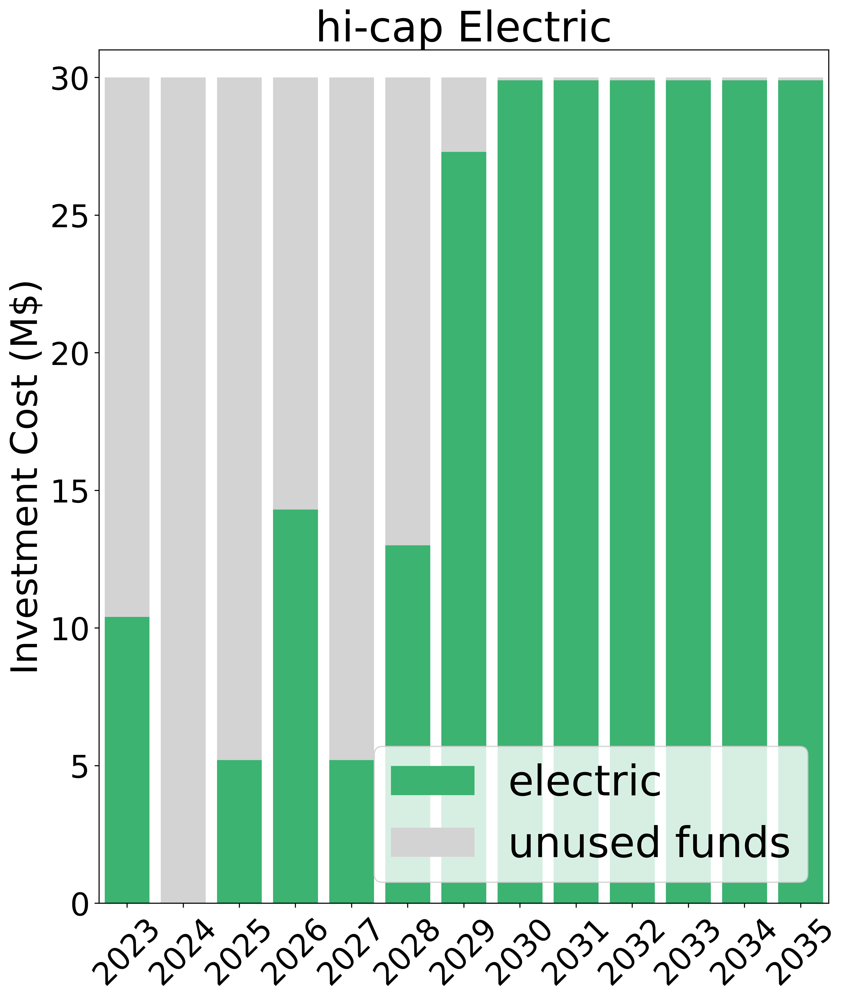

In [24]:
# Filter the dataframe for 'hi-cap Electric' future
hi_cap_electric = merged_df.loc[merged_df['future'] == 'hi-cap Electric']

# Calculate remaining investment
total_investment = 30  # Total investment in millions of dollars
hi_cap_electric['Remaining Investment (M$)'] = total_investment - (
    hi_cap_electric['HEB - Investment Cost (M$)'] + hi_cap_electric['BEB - Investment Cost (M$)'])

# Create a stacked bar plot
plt.figure(figsize=(10, 12), dpi=400)

plt.bar(hi_cap_electric['Year'], hi_cap_electric['BEB - Investment Cost (M$)'],
        bottom=hi_cap_electric['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='electric')

# Adding the remaining investment
plt.bar(hi_cap_electric['Year'], hi_cap_electric['Remaining Investment (M$)'],
        bottom=hi_cap_electric['HEB - Investment Cost (M$)'] + hi_cap_electric['BEB - Investment Cost (M$)'],
        color=palette['Remaining'], label='unused funds')

plt.xticks(hi_cap_hybrid_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)


# Adding labels and title
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('hi-cap Electric', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [25]:
hi_cap_electric['total_cost']=hi_cap_electric['BEB - Investment Cost (M$)']+hi_cap_electric['HEB - Investment Cost (M$)']
print('hi_cap_electric_total_cost:',hi_cap_electric['total_cost'].sum())

hi_cap_electric_total_cost: 254.80000000000004


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\612983904.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hi_cap_electric['total_cost']=hi_cap_electric['BEB - Investment Cost (M$)']+hi_cap_electric['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\682688333.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_cap_electric['Remaining Investment (M$)'] = total_investment - (


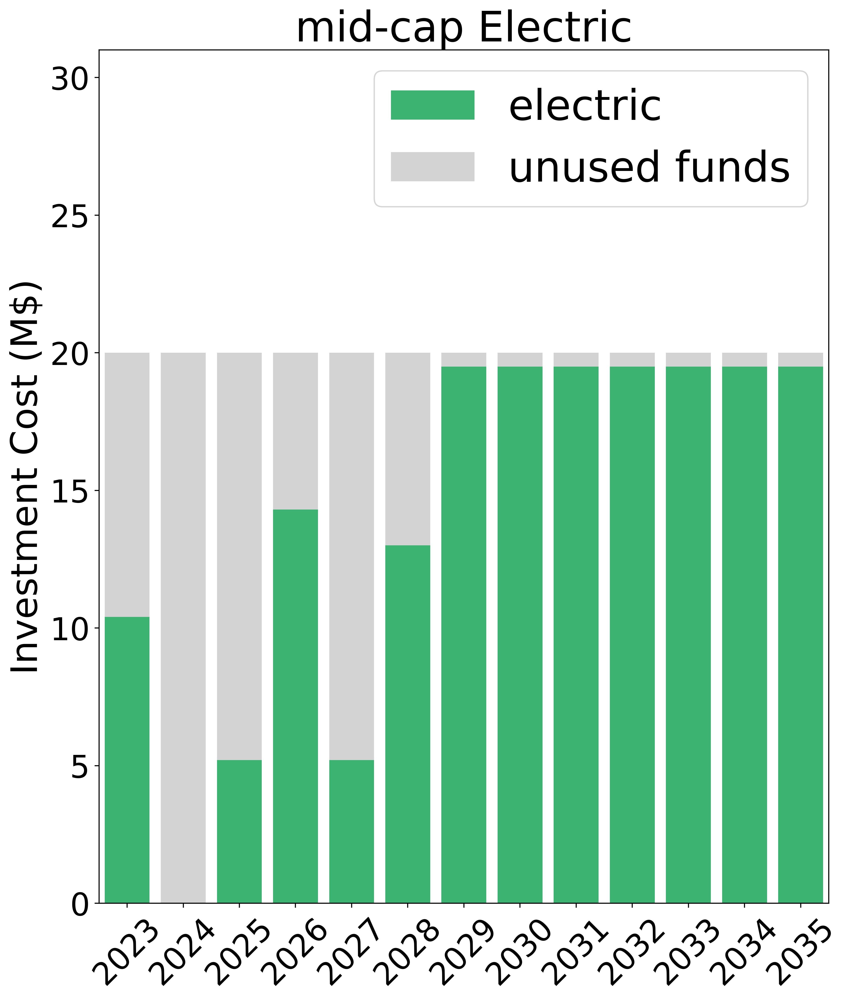

In [26]:
# Filter the dataframe for 'hi-cap Electric' future
mid_cap_electric = merged_df.loc[merged_df['future'] == 'mid-cap Electric']

# Calculate remaining investment
total_investment = 20  # Total investment in millions of dollars
mid_cap_electric['Remaining Investment (M$)'] = total_investment - (
    mid_cap_electric['HEB - Investment Cost (M$)'] + mid_cap_electric['BEB - Investment Cost (M$)'])

# Create a stacked bar plot
plt.figure(figsize=(10, 12), dpi=400)

plt.bar(mid_cap_electric['Year'], mid_cap_electric['BEB - Investment Cost (M$)'],
        bottom=mid_cap_electric['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='electric')

# Adding the remaining investment
plt.bar(mid_cap_electric['Year'], mid_cap_electric['Remaining Investment (M$)'],
        bottom=mid_cap_electric['HEB - Investment Cost (M$)'] + mid_cap_electric['BEB - Investment Cost (M$)'],
        color=palette['Remaining'], label='unused funds')

plt.xticks(mid_cap_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)


# Adding labels and title
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('mid-cap Electric', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [27]:
mid_cap_electric['total_cost']=mid_cap_electric['BEB - Investment Cost (M$)']+mid_cap_electric['HEB - Investment Cost (M$)']
print('mid_cap_electric_total_cost:',mid_cap_electric['total_cost'].sum())

mid_cap_electric_total_cost: 184.6


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\994124717.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_cap_electric['total_cost']=mid_cap_electric['BEB - Investment Cost (M$)']+mid_cap_electric['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\200645936.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lo_cap_electric['Remaining Investment (M$)'] = total_investment - (


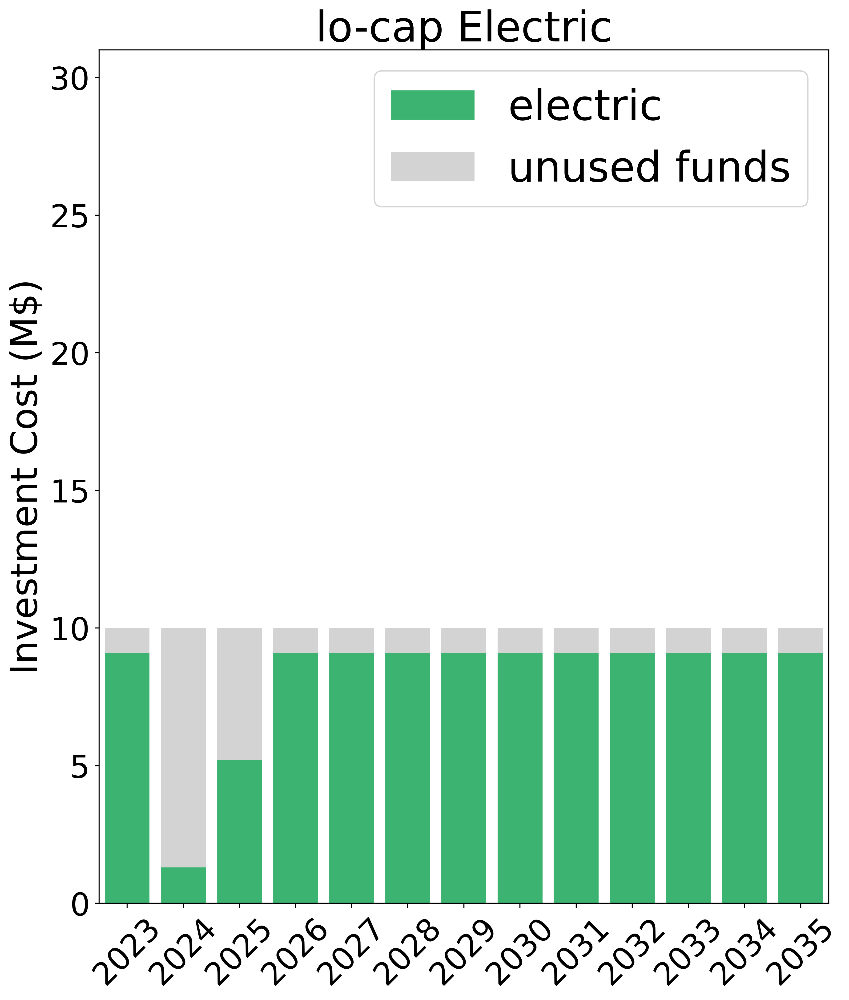

In [28]:
# Filter the dataframe for 'hi-cap Electric' future
lo_cap_electric = merged_df.loc[merged_df['future'] == 'lo-cap Electric']

# Calculate remaining investment
total_investment = 10  # Total investment in millions of dollars
lo_cap_electric['Remaining Investment (M$)'] = total_investment - (
    lo_cap_electric['HEB - Investment Cost (M$)'] + lo_cap_electric['BEB - Investment Cost (M$)'])

# Create a stacked bar plot
plt.figure(figsize=(10, 12), dpi=400)

plt.bar(lo_cap_electric['Year'], lo_cap_electric['BEB - Investment Cost (M$)'],
        bottom=lo_cap_electric['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='electric')

# Adding the remaining investment
plt.bar(lo_cap_electric['Year'], lo_cap_electric['Remaining Investment (M$)'],
        bottom=lo_cap_electric['HEB - Investment Cost (M$)'] + lo_cap_electric['BEB - Investment Cost (M$)'],
        color=palette['Remaining'], label='unused funds')

plt.xticks(lo_cap_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)


# Adding labels and title
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('lo-cap Electric', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [29]:
lo_cap_electric['total_cost']=lo_cap_electric['BEB - Investment Cost (M$)']+lo_cap_electric['HEB - Investment Cost (M$)']
print('lo_cap_electric_total_cost:',lo_cap_electric['total_cost'].sum())

lo_cap_electric_total_cost: 106.59999999999998


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\2210438131.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lo_cap_electric['total_cost']=lo_cap_electric['BEB - Investment Cost (M$)']+lo_cap_electric['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\2549595943.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hi_cap_hybrid['Remaining Investment (M$)'] = total_investment - (


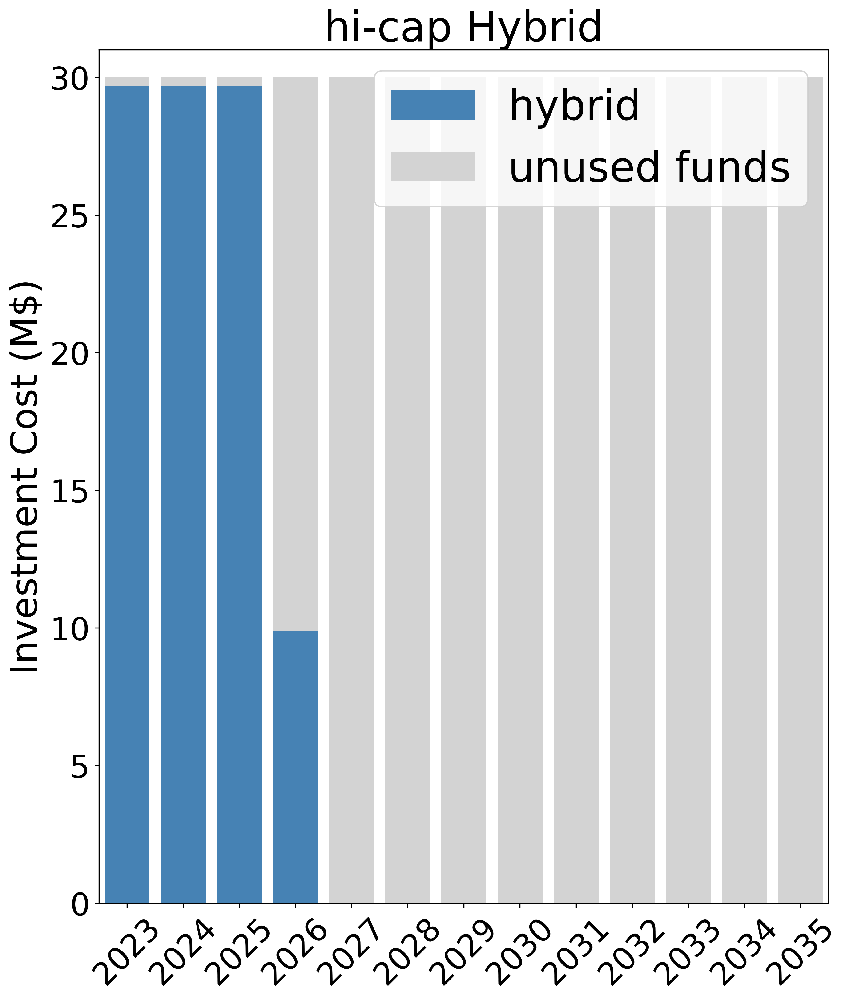

In [30]:
# Define the color palette
palette = {
    'HEB': 'steelblue',
    'Remaining': 'lightgray'  # Color for the remaining investment
}

# Filter the dataframe for 'hi-cap Hybrid Electric' future
hi_cap_hybrid = merged_df.loc[merged_df['future'] == 'hi-cap Hybrid']

# Calculate remaining investment
total_investment = 30  # Total investment in millions of dollars
hi_cap_hybrid['Remaining Investment (M$)'] = total_investment - (
    hi_cap_hybrid['HEB - Investment Cost (M$)'] )

# Create a stacked bar plot with the desired figure size and DPI
plt.figure(figsize=(10, 12), dpi=400)
plt.bar(hi_cap_hybrid['Year'], hi_cap_hybrid['HEB - Investment Cost (M$)'],
        color=palette['HEB'], label='hybrid')
plt.bar(hi_cap_hybrid['Year'], hi_cap_hybrid['Remaining Investment (M$)'],
        bottom=hi_cap_hybrid['HEB - Investment Cost (M$)'] ,
        color=palette['Remaining'], label='unused funds')

plt.xticks(lo_cap_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)

# Adding labels and title
#plt.xlabel('Year', fontsize=28)
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('hi-cap Hybrid', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [31]:
hi_cap_hybrid['total_cost']=hi_cap_hybrid['BEB - Investment Cost (M$)']+hi_cap_hybrid['HEB - Investment Cost (M$)']
print('hi_cap_hybrid_total_cost:',hi_cap_hybrid['total_cost'].sum())

hi_cap_hybrid_total_cost: 99.0


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\2295971197.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hi_cap_hybrid['total_cost']=hi_cap_hybrid['BEB - Investment Cost (M$)']+hi_cap_hybrid['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1604453303.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_cap_hybrid['Remaining Investment (M$)'] = total_investment - (


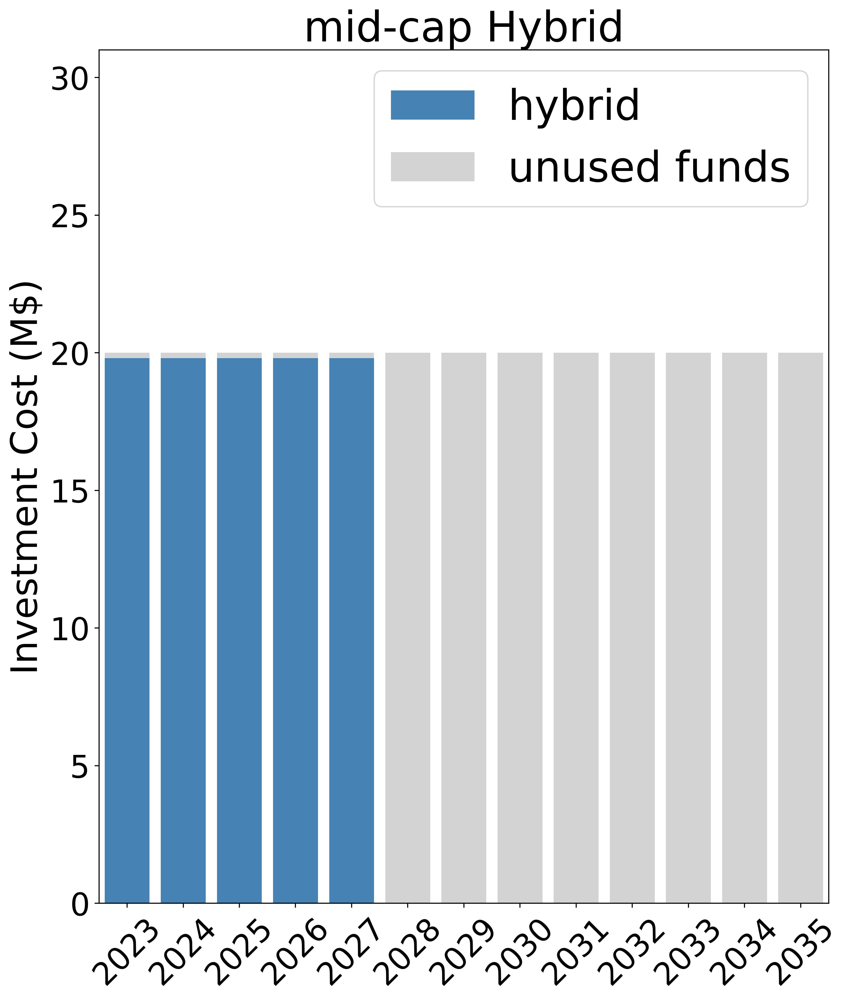

In [32]:
# Filter the dataframe for 'mid-cap Hybrid Electric' future
mid_cap_hybrid = merged_df.loc[merged_df['future'] == 'mid-cap Hybrid']

# Calculate remaining investment
total_investment = 20  # Total investment in millions of dollars
mid_cap_hybrid['Remaining Investment (M$)'] = total_investment - (
   mid_cap_hybrid['HEB - Investment Cost (M$)'] )

# Create a stacked bar plot with the desired figure size and DPI
plt.figure(figsize=(10, 12), dpi=400)
plt.bar(mid_cap_hybrid['Year'], mid_cap_hybrid['HEB - Investment Cost (M$)'],
        color=palette['HEB'], label='hybrid')
plt.bar(mid_cap_hybrid['Year'], mid_cap_hybrid['Remaining Investment (M$)'],
        bottom=mid_cap_hybrid['HEB - Investment Cost (M$)'] ,
        color=palette['Remaining'], label='unused funds')

plt.xticks(lo_cap_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)

# Adding labels and title
#plt.xlabel('Year', fontsize=28)
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('mid-cap Hybrid', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [33]:
mid_cap_hybrid['total_cost']=mid_cap_hybrid['BEB - Investment Cost (M$)']+mid_cap_hybrid['HEB - Investment Cost (M$)']
print('mid_cap_hybrid_total_cost:',mid_cap_hybrid['total_cost'].sum())
print('Remaining Investment (M$):',mid_cap_hybrid['Remaining Investment (M$)'].sum())

mid_cap_hybrid_total_cost: 99.0
Remaining Investment (M$): 181.0


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1246872949.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_cap_hybrid['total_cost']=mid_cap_hybrid['BEB - Investment Cost (M$)']+mid_cap_hybrid['HEB - Investment Cost (M$)']


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\2715060099.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lo_cap_hybrid['Remaining Investment (M$)'] = total_investment - (


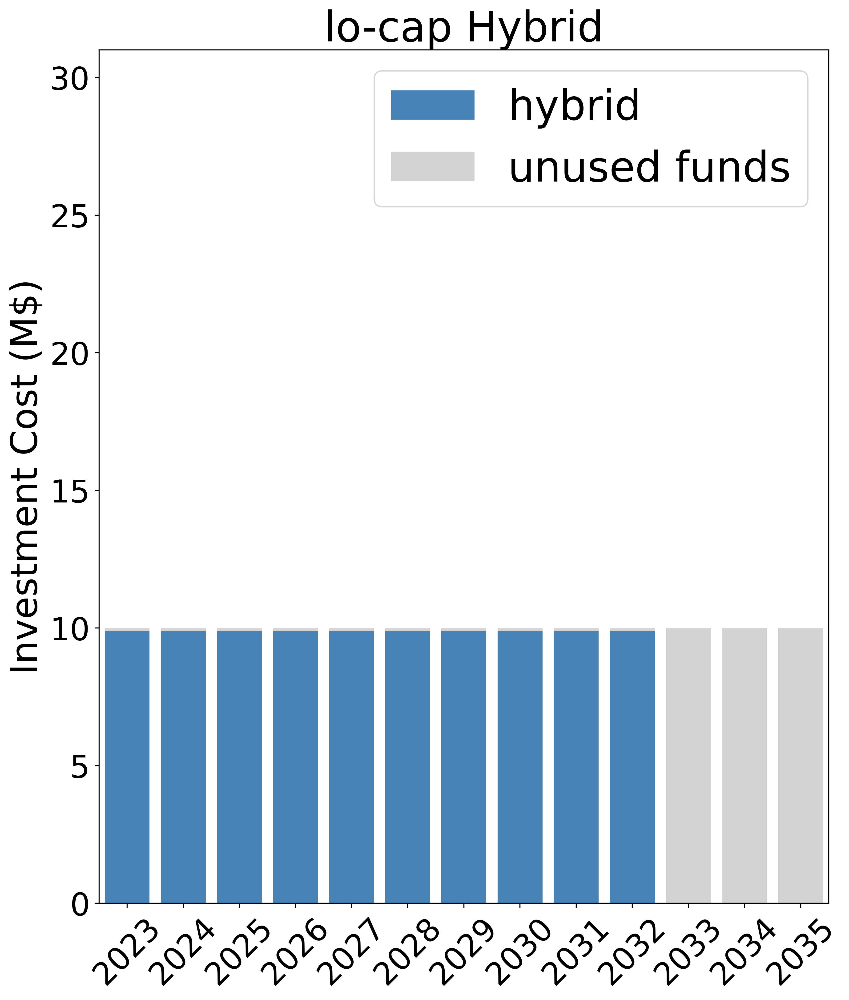

In [34]:
# Filter the dataframe for 'lo-cap Hybrid Electric' future
lo_cap_hybrid = merged_df.loc[merged_df['future'] == 'lo-cap Hybrid']

# Calculate remaining investment
total_investment = 10  # Total investment in millions of dollars
lo_cap_hybrid['Remaining Investment (M$)'] = total_investment - (
   lo_cap_hybrid['HEB - Investment Cost (M$)'] )

# Create a stacked bar plot with the desired figure size and DPI
plt.figure(figsize=(10, 12), dpi=400)
plt.bar(lo_cap_hybrid['Year'], lo_cap_hybrid['HEB - Investment Cost (M$)'],
        color=palette['HEB'], label='hybrid')
plt.bar(lo_cap_hybrid['Year'], lo_cap_hybrid['Remaining Investment (M$)'],
        bottom=lo_cap_hybrid['HEB - Investment Cost (M$)'] ,
        color=palette['Remaining'], label='unused funds')

plt.xticks(lo_cap_electric['Year'], rotation=45, fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(0, 31)
plt.xlim(2022.5, 2035.5)

# Adding labels and title
#plt.xlabel('Year', fontsize=28)
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('lo-cap Hybrid', fontsize=32)
plt.legend(fontsize=32)

# Show the plot
plt.show()


In [35]:
lo_cap_hybrid['total_cost']=lo_cap_hybrid['BEB - Investment Cost (M$)']+lo_cap_hybrid['HEB - Investment Cost (M$)']
print('lo_cap_hybrid_total_cost:',lo_cap_hybrid['total_cost'].sum())
print('Remaining Investment (M$):',lo_cap_hybrid['Remaining Investment (M$)'].sum())

lo_cap_hybrid_total_cost: 99.00000000000003
Remaining Investment (M$): 41.0


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\453165360.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lo_cap_hybrid['total_cost']=lo_cap_hybrid['BEB - Investment Cost (M$)']+lo_cap_hybrid['HEB - Investment Cost (M$)']


In [36]:
replacement_plan = pd.read_csv(r'../../data/tidy/replacement_plan.csv', low_memory=False)

In [37]:
replacement_plan

,Year,conventional,electric,hybrid
0,2022,0,0,0
1,2023,9,0,0
2,2024,5,0,0
3,2025,21,0,0
4,2026,13,0,4
5,2027,8,0,0
6,2028,8,2,3
7,2029,9,0,0
8,2030,9,0,0
9,2031,0,2,0


In [38]:
do_nothing = replacement_plan.copy()

# Calculate the new columns
do_nothing['CDB- Investment Cost (M$)'] = do_nothing['conventional'] * 0.4
do_nothing['HEB - Investment Cost (M$)'] = do_nothing['hybrid'] * 0.9
do_nothing['BEB- Investment Cost (M$)'] = do_nothing['electric'] * 1.3

do_nothing

,Year,conventional,electric,hybrid,CDB- Investment Cost (M$),HEB - Investment Cost (M$),BEB- Investment Cost (M$)
0,2022,0,0,0,0.0,0.0,0.0
1,2023,9,0,0,3.6,0.0,0.0
2,2024,5,0,0,2.0,0.0,0.0
3,2025,21,0,0,8.4,0.0,0.0
4,2026,13,0,4,5.2,3.6,0.0
5,2027,8,0,0,3.2,0.0,0.0
6,2028,8,2,3,3.2,2.7,2.6
7,2029,9,0,0,3.6,0.0,0.0
8,2030,9,0,0,3.6,0.0,0.0
9,2031,0,2,0,0.0,0.0,2.6


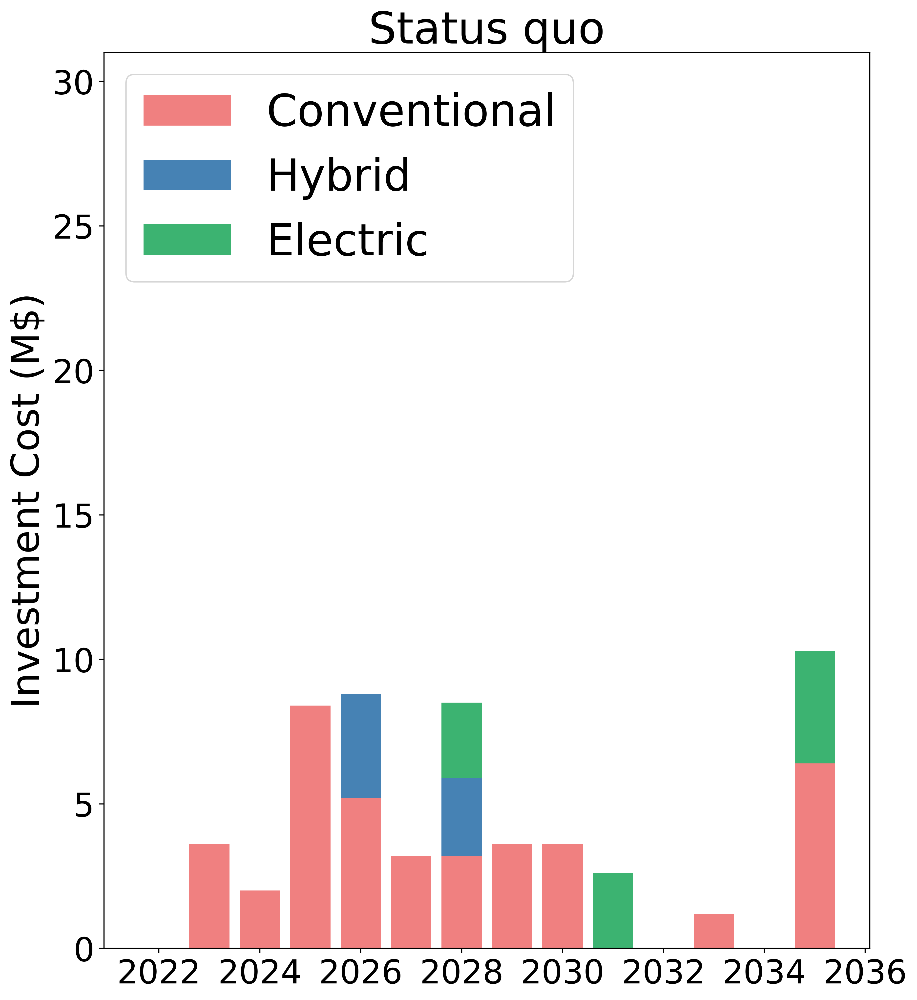

In [39]:
# Define the color palette
palette = {
    'CDB': 'lightcoral',
    'HEB': 'steelblue',
    'BEB': 'mediumseagreen'
}

# Create a stacked bar plot with the desired figure size and DPI
plt.figure(figsize=(10, 12), dpi=400)

# Stacking the bars for each category
plt.bar(do_nothing['Year'], do_nothing['CDB- Investment Cost (M$)'],
        color=palette['CDB'], label='Conventional')
plt.bar(do_nothing['Year'], do_nothing['HEB - Investment Cost (M$)'],
        bottom=do_nothing['CDB- Investment Cost (M$)'],
        color=palette['HEB'], label='Hybrid')
plt.bar(do_nothing['Year'], do_nothing['BEB- Investment Cost (M$)'],
        bottom=do_nothing['CDB- Investment Cost (M$)'] + do_nothing['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='Electric')

# Setting the font size for x and y ticks
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# Adding labels and title
#plt.xlabel('Year', fontsize=28)
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('Status quo', fontsize=32)
plt.legend(fontsize=32, loc='upper left')
plt.ylim(0, 31)


# Show the plot
plt.show()

In [40]:
do_nothing['total_cost']=do_nothing['CDB- Investment Cost (M$)']+do_nothing['HEB - Investment Cost (M$)']+do_nothing['BEB- Investment Cost (M$)']
print('do_nothing_total_cost:',do_nothing['total_cost'].sum())

do_nothing_total_cost: 55.80000000000001


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\1957356692.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pp['CDB - Investment Cost (M$)'] = 0


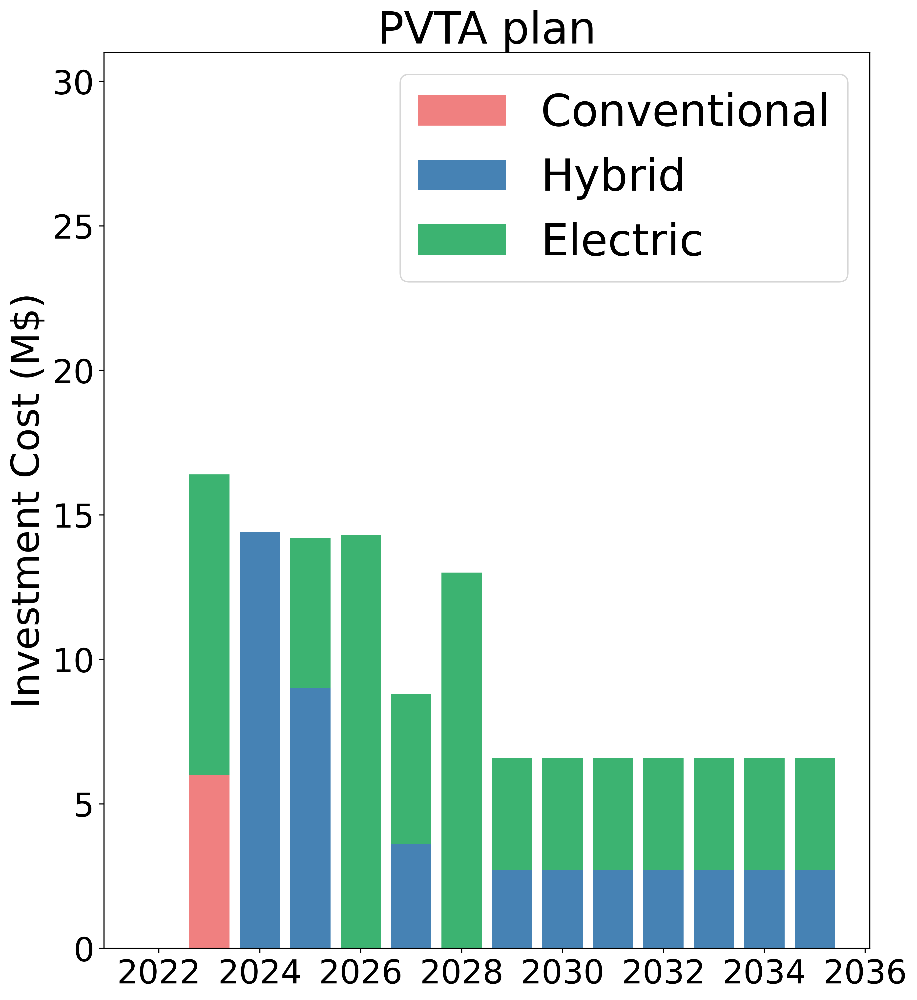

In [41]:
# Define the color palette
palette = {
    'CDB': 'lightcoral',
    'HEB': 'steelblue',
    'BEB': 'mediumseagreen'
}


# Filter the dataframe for 'hi-cap Hybrid Electric' future
pp = merged_df.loc[merged_df['future'] == 'PVTA plan']

# Set the whole column to 0
pp['CDB - Investment Cost (M$)'] = 0

# Set the value for the year 2023 to 20*0.5
pp.loc[pp['Year'] == 2023, 'CDB - Investment Cost (M$)'] = 15 * 0.4


# Create a stacked bar plot with the desired figure size and DPI
plt.figure(figsize=(10, 12), dpi=400)

# for the years 2029 to 2035
#for year in range(2029, 2036):  # This will loop from 2029 to 2035 inclusive
#    pp.loc[pp['Year'] == year, 'CDB - Investment Cost (M$)'] = do_nothing.loc[do_nothing['Year'] == year, 'CDB- Investment Cost (M$)']


# Stacking the bars for each category
plt.bar(pp['Year'], pp['CDB - Investment Cost (M$)'],
        color=palette['CDB'], label='Conventional')
plt.bar(pp['Year'], pp['HEB - Investment Cost (M$)'],
        bottom=pp['CDB - Investment Cost (M$)'],
        color=palette['HEB'], label='Hybrid')
plt.bar(pp['Year'], pp['BEB - Investment Cost (M$)'],
        bottom=pp['CDB - Investment Cost (M$)'] + pp['HEB - Investment Cost (M$)'],
        color=palette['BEB'], label='Electric')

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# Adding labels and title
#plt.xlabel('Year', fontsize=28)
plt.ylabel('Investment Cost (M$)', fontsize=28)
plt.title('PVTA plan', fontsize=32)
plt.legend(fontsize=32)
plt.ylim(0, 31)


# Show the plot
plt.show()


In [42]:
pp

,Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$),future,yearly_purchased_buses,CDB - Investment Cost (M$)
0,2022,15,9,0.0,0.0,0.0,0.0,PVTA plan,0.0,0
1,2023,23,9,8.0,0.0,10.4,0.0,PVTA plan,8.0,6
2,2024,23,25,0.0,16.0,0.0,14.4,PVTA plan,16.0,0
3,2025,27,35,4.0,10.0,5.2,9.0,PVTA plan,14.0,0
4,2026,38,35,11.0,0.0,14.3,0.0,PVTA plan,11.0,0
5,2027,42,39,4.0,4.0,5.2,3.6,PVTA plan,8.0,0
6,2028,52,39,10.0,0.0,13.0,0.0,PVTA plan,10.0,0
7,2029,55,42,3.0,3.0,3.9,2.7,PVTA plan,6.0,0
8,2030,58,45,3.0,3.0,3.9,2.7,PVTA plan,6.0,0
9,2031,61,48,3.0,3.0,3.9,2.7,PVTA plan,6.0,0


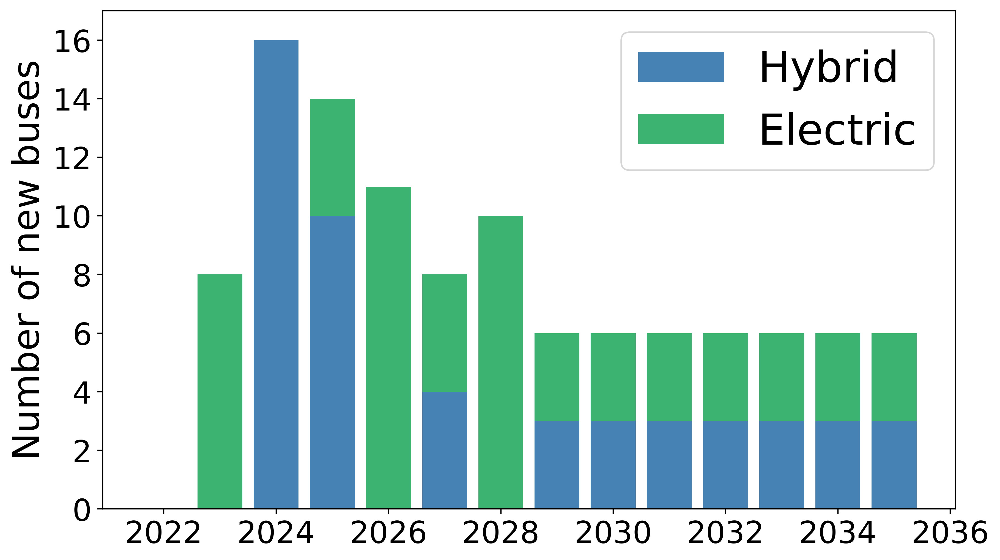

In [43]:

# Create a stacked bar plot with the desired figure size and DPI
plt.figure(figsize=(10, 6), dpi=400)

# Stacking the bars for each category
plt.bar(pp['Year'], pp['HEB - Diff'],
        color=palette['HEB'], label='Hybrid')
plt.bar(pp['Year'], pp['BEB - Diff'],
        bottom=pp['HEB - Diff'],
        color=palette['BEB'], label='Electric')

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

# Adding labels and title
#plt.xlabel('Year', fontsize=28)
plt.ylabel('Number of new buses', fontsize=24)
#plt.title('PVTA plan', fontsize=28)
plt.legend(fontsize=28)
plt.ylim(0, 17)


# Show the plot
plt.show()


In [44]:
pp['total_cost']=pp['CDB - Investment Cost (M$)']+pp['HEB - Investment Cost (M$)']+pp['BEB - Investment Cost (M$)']
print('pp_total_cost:',pp['total_cost'].sum())

pp_total_cost: 127.29999999999997


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_19576\4061961009.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pp['total_cost']=pp['CDB - Investment Cost (M$)']+pp['HEB - Investment Cost (M$)']+pp['BEB - Investment Cost (M$)']


In [45]:
do_nothing

,Year,conventional,electric,hybrid,CDB- Investment Cost (M$),HEB - Investment Cost (M$),BEB- Investment Cost (M$),total_cost
0,2022,0,0,0,0.0,0.0,0.0,0.0
1,2023,9,0,0,3.6,0.0,0.0,3.6
2,2024,5,0,0,2.0,0.0,0.0,2.0
3,2025,21,0,0,8.4,0.0,0.0,8.4
4,2026,13,0,4,5.2,3.6,0.0,8.8
5,2027,8,0,0,3.2,0.0,0.0,3.2
6,2028,8,2,3,3.2,2.7,2.6,8.5
7,2029,9,0,0,3.6,0.0,0.0,3.6
8,2030,9,0,0,3.6,0.0,0.0,3.6
9,2031,0,2,0,0.0,0.0,2.6,2.6


In [46]:
merged_df['CDB- Investment Cost (M$)']=0

In [47]:
# Rename columns
do_nothing = do_nothing.rename(columns={'HEB - Investment Cost (M$)': 'HEB - Investment Cost (M$)', 'BEB- Investment Cost (M$)': 'BEB - Investment Cost (M$)'})

In [48]:
do_nothing['future'] = 'Do_Nothing'
#merged_df['CDB- Investment Cost (M$)']=0

In [49]:
do_nothing

,Year,conventional,electric,hybrid,CDB- Investment Cost (M$),HEB - Investment Cost (M$),BEB - Investment Cost (M$),total_cost,future
0,2022,0,0,0,0.0,0.0,0.0,0.0,Do_Nothing
1,2023,9,0,0,3.6,0.0,0.0,3.6,Do_Nothing
2,2024,5,0,0,2.0,0.0,0.0,2.0,Do_Nothing
3,2025,21,0,0,8.4,0.0,0.0,8.4,Do_Nothing
4,2026,13,0,4,5.2,3.6,0.0,8.8,Do_Nothing
5,2027,8,0,0,3.2,0.0,0.0,3.2,Do_Nothing
6,2028,8,2,3,3.2,2.7,2.6,8.5,Do_Nothing
7,2029,9,0,0,3.6,0.0,0.0,3.6,Do_Nothing
8,2030,9,0,0,3.6,0.0,0.0,3.6,Do_Nothing
9,2031,0,2,0,0.0,0.0,2.6,2.6,Do_Nothing


In [50]:
merged_df['total_cost'] = merged_df['BEB - Investment Cost (M$)'] + merged_df['HEB - Investment Cost (M$)']+ merged_df['CDB- Investment Cost (M$)']

In [51]:
merged_df

,Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$),future,yearly_purchased_buses,CDB- Investment Cost (M$),total_cost
0,2022,15,9,0.0,0.0,0.0,0.0,PVTA plan,0.0,0,0.0
1,2023,23,9,8.0,0.0,10.4,0.0,PVTA plan,8.0,0,10.4
2,2024,23,25,0.0,16.0,0.0,14.4,PVTA plan,16.0,0,14.4
3,2025,27,35,4.0,10.0,5.2,9.0,PVTA plan,14.0,0,14.2
4,2026,38,35,11.0,0.0,14.3,0.0,PVTA plan,11.0,0,14.3
...,...,...,...,...,...,...,...,...,...,...,...
135,2031,68,32,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0,0,10.0
136,2032,75,33,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0,0,10.0
137,2033,82,34,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0,0,10.0
138,2034,89,35,7.0,1.0,9.1,0.9,lo-cap Hybrid Electric,8.0,0,10.0


In [52]:
merged_df.loc[merged_df['future']=='PVTA plan']

,Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$),future,yearly_purchased_buses,CDB- Investment Cost (M$),total_cost
0,2022,15,9,0.0,0.0,0.0,0.0,PVTA plan,0.0,0,0.0
1,2023,23,9,8.0,0.0,10.4,0.0,PVTA plan,8.0,0,10.4
2,2024,23,25,0.0,16.0,0.0,14.4,PVTA plan,16.0,0,14.4
3,2025,27,35,4.0,10.0,5.2,9.0,PVTA plan,14.0,0,14.2
4,2026,38,35,11.0,0.0,14.3,0.0,PVTA plan,11.0,0,14.3
5,2027,42,39,4.0,4.0,5.2,3.6,PVTA plan,8.0,0,8.8
6,2028,52,39,10.0,0.0,13.0,0.0,PVTA plan,10.0,0,13.0
7,2029,55,42,3.0,3.0,3.9,2.7,PVTA plan,6.0,0,6.6
8,2030,58,45,3.0,3.0,3.9,2.7,PVTA plan,6.0,0,6.6
9,2031,61,48,3.0,3.0,3.9,2.7,PVTA plan,6.0,0,6.6


In [53]:
do_nothing['future']='Status quo'

In [54]:
do_nothing

,Year,conventional,electric,hybrid,CDB- Investment Cost (M$),HEB - Investment Cost (M$),BEB - Investment Cost (M$),total_cost,future
0,2022,0,0,0,0.0,0.0,0.0,0.0,Status quo
1,2023,9,0,0,3.6,0.0,0.0,3.6,Status quo
2,2024,5,0,0,2.0,0.0,0.0,2.0,Status quo
3,2025,21,0,0,8.4,0.0,0.0,8.4,Status quo
4,2026,13,0,4,5.2,3.6,0.0,8.8,Status quo
5,2027,8,0,0,3.2,0.0,0.0,3.2,Status quo
6,2028,8,2,3,3.2,2.7,2.6,8.5,Status quo
7,2029,9,0,0,3.6,0.0,0.0,3.6,Status quo
8,2030,9,0,0,3.6,0.0,0.0,3.6,Status quo
9,2031,0,2,0,0.0,0.0,2.6,2.6,Status quo


In [55]:
result_df = pd.concat([merged_df, do_nothing], ignore_index=True)

In [56]:
#result_df['Total Investment Cost (M$)'] = result_df['BEB - Investment Cost (M$)'] + merged_df['HEB - Investment Cost (M$)']+ merged_df['CDB- Investment Cost (M$)']

In [57]:
result_df

,Year,BEB - Value,HEB - Value,BEB - Diff,HEB - Diff,BEB - Investment Cost (M$),HEB - Investment Cost (M$),future,yearly_purchased_buses,CDB- Investment Cost (M$),total_cost,conventional,electric,hybrid
0,2022,15.0,9.0,0.0,0.0,0.0,0.0,PVTA plan,0.0,0.0,0.0,NaN,NaN,NaN
1,2023,23.0,9.0,8.0,0.0,10.4,0.0,PVTA plan,8.0,0.0,10.4,NaN,NaN,NaN
2,2024,23.0,25.0,0.0,16.0,0.0,14.4,PVTA plan,16.0,0.0,14.4,NaN,NaN,NaN
3,2025,27.0,35.0,4.0,10.0,5.2,9.0,PVTA plan,14.0,0.0,14.2,NaN,NaN,NaN
4,2026,38.0,35.0,11.0,0.0,14.3,0.0,PVTA plan,11.0,0.0,14.3,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,2031,NaN,NaN,NaN,NaN,2.6,0.0,Status quo,NaN,0.0,2.6,0.0,2.0,0.0
150,2032,NaN,NaN,NaN,NaN,0.0,0.0,Status quo,NaN,0.0,0.0,0.0,0.0,0.0
151,2033,NaN,NaN,NaN,NaN,0.0,0.0,Status quo,NaN,1.2,1.2,3.0,0.0,0.0
152,2034,NaN,NaN,NaN,NaN,0.0,0.0,Status quo,NaN,0.0,0.0,0.0,0.0,0.0


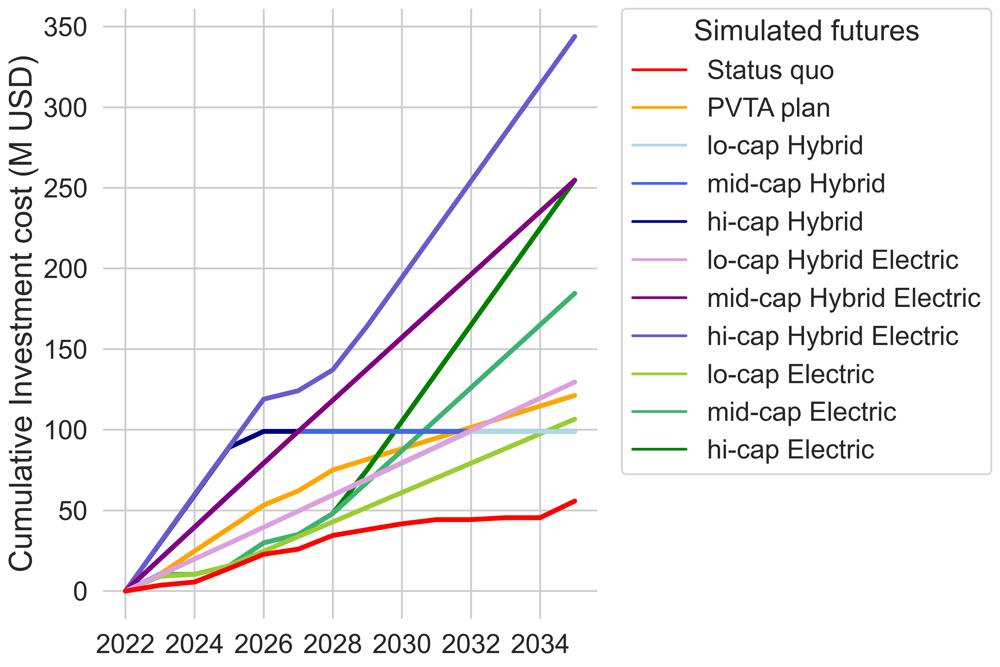

In [128]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Your custom palette and markers
custom_palette = {
    "Status quo": "red",
    "PVTA plan": "orange",
    "lo-cap Hybrid": "lightblue",
    "mid-cap Hybrid": "royalblue",
    "hi-cap Hybrid": "navy",
    "lo-cap Hybrid Electric": "plum",
    "mid-cap Hybrid Electric": "purple",
    "hi-cap Hybrid Electric": "slateblue",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

custom_markers = {
    "Status quo": "P",
    "PVTA plan": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

# Calculate cumulative sum
result_df['cumulative_cost'] = result_df.groupby('future')['total_cost'].cumsum()

# Plotting code
plt.figure(figsize=(12, 8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Loop through each category and plot
for future in result_df['future'].unique():
    subset = result_df[result_df['future'] == future]
    sns.lineplot(data=subset, x='Year', y='cumulative_cost', label=future,
                 color=custom_palette[future], dashes=False,linewidth=4)

# Custom legend in the order of your palette
order = ["Status quo", "PVTA plan", "lo-cap Hybrid", "mid-cap Hybrid", "hi-cap Hybrid", "lo-cap Hybrid Electric", "mid-cap Hybrid Electric", "hi-cap Hybrid Electric",
         "lo-cap Electric", "mid-cap Electric", "hi-cap Electric"]
labels = [future for future in order]
handles = [plt.Line2D([0], [0], color=custom_palette[future], markersize=10, label=future) for future in order]

plt.legend(handles, labels,
           title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=22, title_fontsize='24')

plt.xlabel('', fontsize=26)
plt.ylabel('Cumulative Investment cost (M USD)', fontsize=26)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()


In [59]:
fleet = pd.read_excel(r'../../results/fleet-composition-with-replacement-40percentBEBcharging.xlsx', engine='openpyxl')

In [60]:
# Define a mapping dictionary
year_mapping = {i: 2022 + i for i in range(0, 14)}

# Apply the mapping
fleet['Year'] = fleet['Year'].map(year_mapping)

In [61]:
fleet['future'] = fleet['future'].replace('Do-Nothing', 'Status quo')
fleet['future'] = fleet['future'].replace('PVTA 5-Year', 'PVTA plan')

In [62]:
fleet['future'].unique()

array(['Status quo', 'PVTA plan', 'lo-cap Hybrid', 'mid-cap Hybrid',
       'hi-cap Hybrid', 'lo-cap Hybrid Electric',
       'mid-cap Hybrid Electric', 'hi-cap Hybrid Electric',
       'lo-cap Electric', 'mid-cap Electric', 'hi-cap Electric'],
      dtype=object)

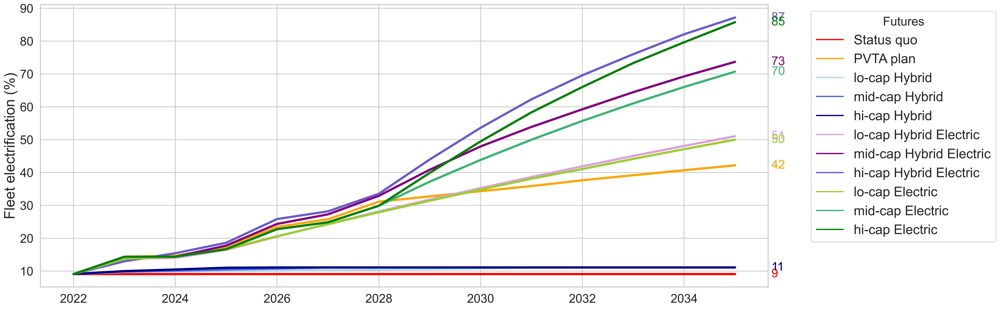

In [115]:
#fleet['Year'] = fleet['Year'] + 22
# Set the style to whitegrid
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(20,8), dpi=400)


# Define a custom palette and marker order
#custom_palette = {
#    "Status quo": "black",
#    "PVTA plan": "grey",
#    "lo-cap Hybrid": "lightcoral",
#    "mid-cap Hybrid": "indianred",
#    "hi-cap Hybrid": "red",
#    "lo-cap Hybrid Electric": "aqua",
#    "mid-cap Hybrid Electric": "royalblue",
#    "hi-cap Hybrid Electric": "navy",
#    "lo-cap Electric": "yellowgreen",
#    "mid-cap Electric": "mediumseagreen",
#    "hi-cap Electric": "green"
#}

custom_palette = {
    "Status quo": "red",
    "PVTA plan": "orange",
    "lo-cap Hybrid": "lightblue",
    "mid-cap Hybrid": "royalblue",
    "hi-cap Hybrid": "navy",
    "lo-cap Hybrid Electric": "plum",
    "mid-cap Hybrid Electric": "purple",
    "hi-cap Hybrid Electric": "slateblue",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

custom_markers = {
    "Status quo": "P",
    "PVTA plan": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

# Get the markers in the same order as the unique values in the 'future' column
markers_order = [custom_markers[future] for future in fleet['future'].unique()]

plot = sns.lineplot(data=fleet, x='Year', y=fleet['electrification']*100, hue='future',
                    palette=custom_palette, dashes=False, style='future',linewidth=4,)



# Annotate with the final number of the final year on each line
for line, name in zip(plot.lines, fleet['future'].unique()):
    y = line.get_ydata()[-1]
    plt.annotate(f'{int(y)}', xy=(1, y), xytext=(6, 0), color=line.get_color(),
                 xycoords = plot.get_yaxis_transform(), textcoords="offset points", 
                 size=22, va="center")

plt.ylabel('Fleet electrification (%)', fontsize=26)
plt.xlabel('', fontsize=26)
#plt.title('Electrification Percentage Over Years')
plt.grid(True, which="both")
plt.tight_layout()

# Move the legend outside the plot on the right side
plt.legend(title='Futures', title_fontsize='22', fontsize=24, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)    

# Save the figure with high resolution
plt.savefig(r'../../figures/Electrification_Percentage_Over_Years.png', dpi=400, bbox_inches='tight')

plt.show()


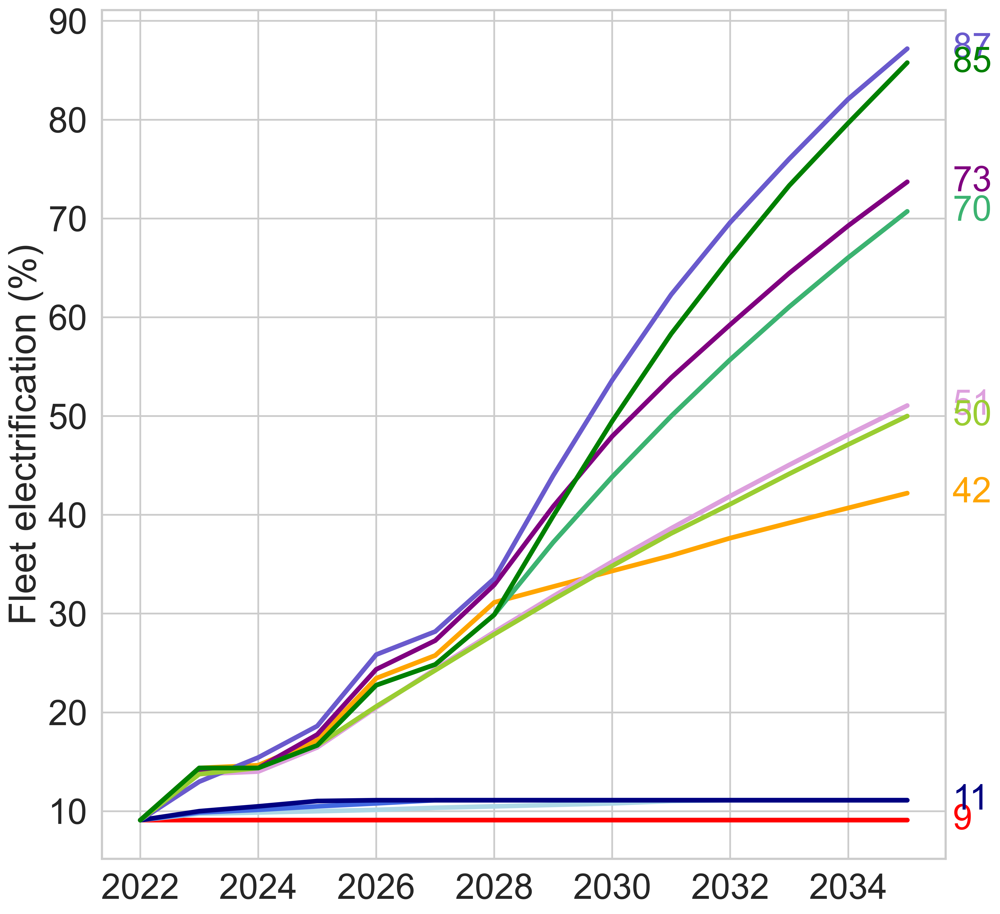

In [127]:
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(12,11), dpi=400)

custom_palette = {
    "Status quo": "red",
    "PVTA plan": "orange",
    "lo-cap Hybrid": "lightblue",
    "mid-cap Hybrid": "royalblue",
    "hi-cap Hybrid": "navy",
    "lo-cap Hybrid Electric": "plum",
    "mid-cap Hybrid Electric": "purple",
    "hi-cap Hybrid Electric": "slateblue",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

custom_markers = {
    "Status quo": "P",
    "PVTA plan": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

# Get the markers in the same order as the unique values in the 'future' column
markers_order = [custom_markers[future] for future in fleet['future'].unique()]

plot = sns.lineplot(data=fleet, x='Year', y=fleet['electrification']*100, hue='future',
                    palette=custom_palette, dashes=False, style='future',linewidth=4,)



# Annotate with the final number of the final year on each line
for line, name in zip(plot.lines, fleet['future'].unique()):
    y = line.get_ydata()[-1]
    plt.annotate(f'{int(y)}', xy=(1, y), xytext=(6, 0), color=line.get_color(),
                 xycoords = plot.get_yaxis_transform(), textcoords="offset points", 
                 size=30, va="center")

plt.ylabel('Fleet electrification (%)', fontsize=32)
plt.xlabel('', fontsize=32)
plt.grid(True, which="both")
plt.tight_layout()

plt.xticks(fontsize=30)
plt.yticks(fontsize=30) 
plot.legend_.remove() 

# Save the figure with high resolution
plt.savefig(r'../../figures/Electrification_Percentage_Over_Years.png', dpi=400, bbox_inches='tight')

plt.show()


In [64]:
h_pp = pd.read_csv(r'../../results/highcap-PP-optimized-variables-with-replacement-y.csv', low_memory=False)
h_FE = pd.read_csv(r'../../results/highcap-FE-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
m_FE = pd.read_csv(r'../../results/midcap-FE-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
l_FE = pd.read_csv(r'../../results/lowcap-FE-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
h_FH = pd.read_csv(r'../../results/highcap-FH-optimized-variables-with-replacement-y.csv', low_memory=False)
m_FH = pd.read_csv(r'../../results/midcap-FH-optimized-variables-with-replacement-y.csv', low_memory=False)
l_FH = pd.read_csv(r'../../results/lowcap-FH-optimized-variables-with-replacement-y.csv', low_memory=False)
h_HE = pd.read_csv(r'../../results/highcap-BM-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
m_HE = pd.read_csv(r'../../results/midcap-BM-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)
l_HE = pd.read_csv(r'../../results/lowcap-BM-optimized-variables-with-replacement-40percentBEBcharging-y.csv', low_memory=False)

In [65]:
### Plot charging infrastructure

h_pp['future']="PVTA plan"
h_FE['future']= "hi-cap Electric"
m_FE['future']= "mid-cap Electric"
l_FE['future']= "lo-cap Electric"
h_FH['future']= "hi-cap Hybrid"
m_FH['future']= "mid-cap Hybrid"
l_FH['future']= "lo-cap Hybrid"
h_HE['future']= "hi-cap Hybrid Electric"
m_HE['future']= "mid-cap Hybrid Electric"
l_HE['future']= "lo-cap Hybrid Electric"

# Concatenating all dataframes
all_dataframes = [h_pp, h_FE, m_FE, l_FE, h_FH, m_FH, l_FH, h_HE, m_HE, l_HE]
combined_df = pd.concat(all_dataframes, ignore_index=True)
# Apply the mapping
combined_df['Year'] = combined_df['Year'].map(year_mapping)

custom_palette = {
    "Status quo": "red",
    "PVTA plan": "orange",
    "lo-cap Hybrid": "lightblue",
    "mid-cap Hybrid": "royalblue",
    "hi-cap Hybrid": "navy",
    "lo-cap Hybrid Electric": "plum",
    "mid-cap Hybrid Electric": "purple",
    "hi-cap Hybrid Electric": "slateblue",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

custom_markers = {
    "PVTA plan": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

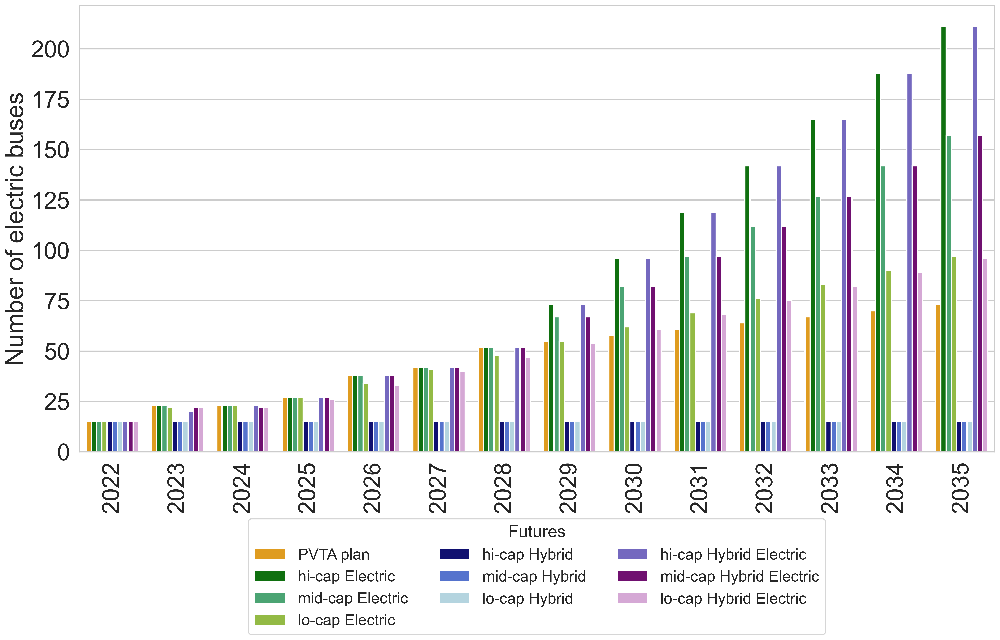

In [66]:
#combined_df['Year']=combined_df['Year']+22
# Set the style to whitegrid
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(18,12), dpi=400)

# Filter for rows where Powertrain is 'BEB'
beb_df = combined_df[combined_df['Powertrain'] == 'BEB']

plot = sns.barplot(data=beb_df, x='Year', y='Value', hue='future', palette=custom_palette)
#plt.ylabel('Required daily charging \n infrastructure (number of buses)', fontsize=32)
plt.ylabel('Number of electric buses', fontsize=32)

plt.xlabel('')

# Set the legend below the plot with horizontal orientation
plt.legend(title='Futures', title_fontsize='22', fontsize=20, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3, borderaxespad=0.)

plt.tight_layout()

plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=30)

# Save the figure with high resolution
plt.savefig(r'../../figures/charging-infra.png', dpi=400, bbox_inches='tight')

plt.show()


In [67]:
pivot_df = pd.read_pickle(r'../../results/pivot_df.pkl')

In [68]:
grouped_df=result_df[['Year','future','cumulative_cost']].copy()

In [69]:
pivot_df

Strategy,PVTA plan,Hybrid,Hybrid Electric,Electric
Scenario,,,,
lo-cap,NaN,14.353959,22.428664,17.994106
mid-cap,23.344197,18.142888,37.958893,26.290945
hi-cap,NaN,19.376049,44.530518,32.261544


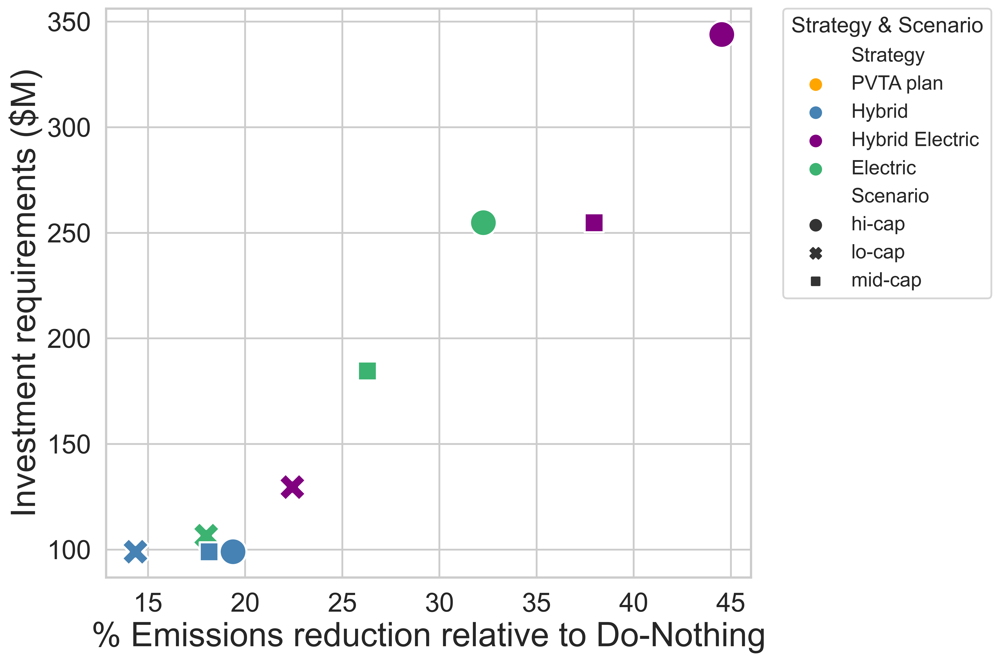

In [70]:
# Reshaping pivot_df
pivot_melted = pivot_df.reset_index().melt(id_vars='Scenario', 
                                           value_vars=pivot_df.columns, 
                                           var_name='Strategy', 
                                           value_name='%Decrease')

# Create a combined column for Scenario and Strategy
pivot_melted['Scenario-Strategy'] = pivot_melted['Scenario'] + ' ' + pivot_melted['Strategy']

# Merging the two dataframes
combined_df = pd.merge(pivot_melted, 
                       grouped_df, 
                       left_on='Scenario-Strategy', 
                       right_on='future', 
                       how='inner')

# Group by 'Scenario' and 'Strategy' and sum the 'Cumulative Cost'
final_df = combined_df.groupby(['Scenario', 'Strategy']).agg({'%Decrease': 'first', 'cumulative_cost': 'max'}).reset_index()

# Defining colors for strategies
colors = {'PVTA plan': 'orange', 'Hybrid': 'steelblue', 'Hybrid Electric': 'purple', 'Electric': 'mediumseagreen'}

# Plotting
plt.figure(figsize=(12, 8), dpi=400)
sns.scatterplot(data=final_df, 
                x='%Decrease', 
                y='cumulative_cost', 
                hue='Strategy',  # Color by Strategy
                hue_order=colors.keys(),
                palette=colors,  # Using the custom colors
                style='Scenario',  # Shape by Scenario
                s=500)

plt.xlabel('% Emissions reduction relative to Do-Nothing', fontsize=28)
plt.ylabel('Investment requirements ($M)', fontsize=28)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.legend(title='Strategy & Scenario', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.savefig(r'../../figures/scatterplot_reduction_vs_investment_modified.png', bbox_inches='tight', dpi=400)
plt.show()


In [71]:
pivot_df_emission = pd.read_pickle(r'../../results/pivot_df_emission.pkl')

In [72]:
pivot_df_emission

Strategy,Status quo,PVTA plan,Hybrid,Hybrid Electric,Electric
Scenario,,,,,
hi-cap,NaN,NaN,6.199371,4.265183,5.208574
mid-cap,NaN,5.89425,6.294192,4.770491,5.667668
lo-cap,7.689242,NaN,6.585532,5.964648,6.305632


In [73]:
grouped_df['future'] = grouped_df['future'].replace('PVTA plan','mid-cap PVTA plan')

In [74]:
grouped_df

,Year,future,cumulative_cost
0,2022,mid-cap PVTA plan,0.0
1,2023,mid-cap PVTA plan,10.4
2,2024,mid-cap PVTA plan,24.8
3,2025,mid-cap PVTA plan,39.0
4,2026,mid-cap PVTA plan,53.3
...,...,...,...
149,2031,Status quo,44.3
150,2032,Status quo,44.3
151,2033,Status quo,45.5
152,2034,Status quo,45.5


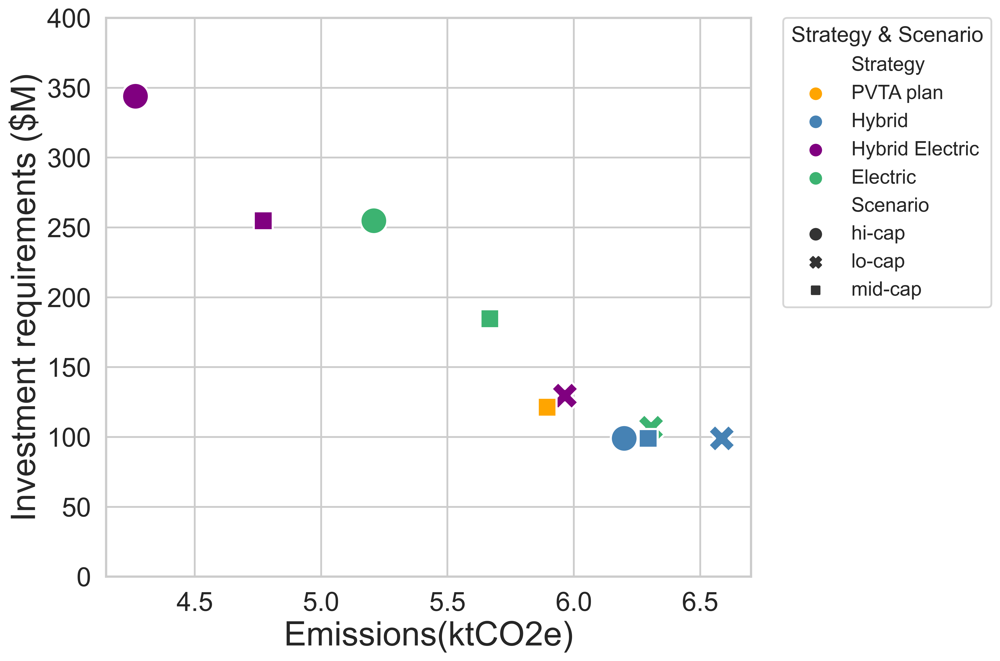

In [75]:
# Reshaping pivot_df
pivot_melted = pivot_df_emission.reset_index().melt(id_vars='Scenario', 
                                           value_vars=pivot_df.columns, 
                                           var_name='Strategy', 
                                           value_name='CO2')

# Create a combined column for Scenario and Strategy
pivot_melted['Scenario-Strategy'] = pivot_melted['Scenario'] + ' ' + pivot_melted['Strategy']

# Merging the two dataframes
combined_df = pd.merge(pivot_melted, 
                       grouped_df, 
                       left_on='Scenario-Strategy', 
                       right_on='future', 
                       how='inner')

# Group by 'Scenario' and 'Strategy' and sum the 'Cumulative Cost'
final_df = combined_df.groupby(['Scenario', 'Strategy']).agg({'CO2': 'first', 'cumulative_cost': 'max'}).reset_index()

# Defining colors for strategies
colors = {'PVTA plan': 'orange','Hybrid': 'steelblue', 'Hybrid Electric': 'purple', 'Electric': 'mediumseagreen'}

# Plotting
plt.figure(figsize=(12, 8), dpi=400)
sns.scatterplot(data=final_df, 
                x='CO2', 
                y='cumulative_cost', 
                hue='Strategy',  # Color by Strategy
                hue_order=colors.keys(),
                palette=colors,  # Using the custom colors
                style='Scenario',  # Shape by Scenario
                s=500)

plt.xlabel('Emissions(ktCO2e)', fontsize=28)
plt.ylabel('Investment requirements ($M)', fontsize=28)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.ylim(0, 400)


plt.legend(title='Strategy & Scenario', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.savefig(r'../../figures/scatterplot_reduction_vs_investment_modified.png', bbox_inches='tight', dpi=400)
plt.show()


In [76]:
import numpy as np
pivot_melted['investment_gap'] = np.nan

pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'hi-cap Hybrid', 'investment_gap'] = 31
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'mid-cap Hybrid', 'investment_gap'] = 161
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'lo-cap Hybrid', 'investment_gap'] = 291
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'hi-cap Hybrid Electric', 'investment_gap'] = 0
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'mid-cap Hybrid Electric', 'investment_gap'] = 5
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'lo-cap Hybrid Electric', 'investment_gap'] = 46
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'hi-cap Electric', 'investment_gap'] = 23
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'mid-cap Electric', 'investment_gap'] = 75
pivot_melted.loc[pivot_melted['Scenario-Strategy'] == 'lo-cap Electric', 'investment_gap'] = 135
pivot_melted

,Scenario,Strategy,CO2,Scenario-Strategy,investment_gap
0,hi-cap,PVTA plan,NaN,hi-cap PVTA plan,NaN
1,mid-cap,PVTA plan,5.894250,mid-cap PVTA plan,NaN
2,lo-cap,PVTA plan,NaN,lo-cap PVTA plan,NaN
3,hi-cap,Hybrid,6.199371,hi-cap Hybrid,31.0
4,mid-cap,Hybrid,6.294192,mid-cap Hybrid,161.0
5,lo-cap,Hybrid,6.585532,lo-cap Hybrid,291.0
6,hi-cap,Hybrid Electric,4.265183,hi-cap Hybrid Electric,0.0
7,mid-cap,Hybrid Electric,4.770491,mid-cap Hybrid Electric,5.0
8,lo-cap,Hybrid Electric,5.964648,lo-cap Hybrid Electric,46.0
9,hi-cap,Electric,5.208574,hi-cap Electric,23.0


In [77]:
final_df['CO2_reduction']=7.689242-final_df['CO2']

In [78]:
final_df['CO2_reduction_per_million']=final_df['CO2_reduction']/final_df['cumulative_cost']

In [79]:
final_df

,Scenario,Strategy,CO2,cumulative_cost,CO2_reduction,CO2_reduction_per_million
0,hi-cap,Electric,5.208574,254.8,2.480668,0.009736
1,hi-cap,Hybrid,6.199371,99.0,1.489871,0.015049
2,hi-cap,Hybrid Electric,4.265183,343.9,3.424059,0.009957
3,lo-cap,Electric,6.305632,106.6,1.383610,0.012979
4,lo-cap,Hybrid,6.585532,99.0,1.103710,0.011149
5,lo-cap,Hybrid Electric,5.964648,129.6,1.724594,0.013307
6,mid-cap,Electric,5.667668,184.6,2.021574,0.010951
7,mid-cap,Hybrid,6.294192,99.0,1.395050,0.014091
8,mid-cap,Hybrid Electric,4.770491,254.8,2.918751,0.011455
9,mid-cap,PVTA plan,5.894250,121.3,1.794992,0.014798


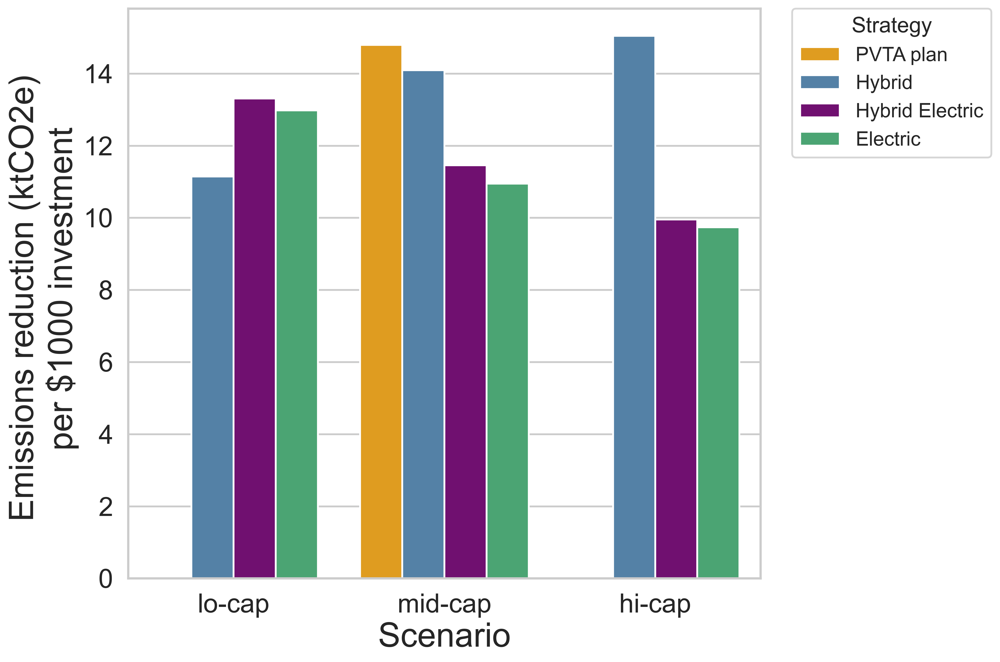

In [86]:
## Make bar plot of % emissions reduction per million

final_df['CO2_reduction_per_$1000']=final_df['CO2_reduction_per_million']*1000

# Defining colors for strategies
colors = {'PVTA plan': 'orange','Hybrid': 'steelblue', 'Hybrid Electric': 'purple', 'Electric': 'mediumseagreen'}


# Ordering scenarios
order_of_scenarios = ['lo-cap', 'mid-cap', 'hi-cap']

# Plotting
plt.figure(figsize=(12, 8), dpi=400)
sns.barplot(data=final_df, 
            x='Scenario', 
            y='CO2_reduction_per_$1000', 
            hue='Strategy',  # Color by Strategy
            hue_order=colors.keys(),
            order=order_of_scenarios,  # Explicitly specify the order
            palette=colors),  # Using the custom colors) 

plt.xlabel('Scenario', fontsize=28)
plt.ylabel('Emissions reduction (ktCO2e) \n per $1000 investment', fontsize=28)

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.legend(title='Strategy', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.savefig(r'../../figures/barplot_reduction_per_dollar.png', bbox_inches='tight', dpi=400)
plt.show()



In [81]:
def calculate_unused_fund(row):
    if row['Scenario'] == 'hi-cap':
        return 390 - row['cumulative_cost']
    elif row['Scenario'] == 'mid-cap':
        return 260 - row['cumulative_cost']
    elif row['Scenario'] == 'lo-cap':
        return 130 - row['cumulative_cost']
    else:
        return None  # Or some default value

# Apply this function to each row of the DataFrame
final_df['unused_fund'] = final_df.apply(calculate_unused_fund, axis=1)
final_df

,Scenario,Strategy,CO2,cumulative_cost,CO2_reduction,CO2_reduction_per_million,CO2_reduction_per_$1000,unused_fund
0,hi-cap,Electric,5.208574,254.8,2.480668,0.009736,9.735746,135.2
1,hi-cap,Hybrid,6.199371,99.0,1.489871,0.015049,15.049203,291.0
2,hi-cap,Hybrid Electric,4.265183,343.9,3.424059,0.009957,9.956555,46.1
3,lo-cap,Electric,6.305632,106.6,1.383610,0.012979,12.979458,23.4
4,lo-cap,Hybrid,6.585532,99.0,1.103710,0.011149,11.148590,31.0
5,lo-cap,Hybrid Electric,5.964648,129.6,1.724594,0.013307,13.307053,0.4
6,mid-cap,Electric,5.667668,184.6,2.021574,0.010951,10.951106,75.4
7,mid-cap,Hybrid,6.294192,99.0,1.395050,0.014091,14.091418,161.0
8,mid-cap,Hybrid Electric,4.770491,254.8,2.918751,0.011455,11.455067,5.2
9,mid-cap,PVTA plan,5.894250,121.3,1.794992,0.014798,14.797953,138.7


In [82]:
final_df['cost_including_redundancy'] = final_df['cumulative_cost']*1.25

In [83]:
final_df.sort_values(by='CO2_reduction_per_$1000', ascending=True)


,Scenario,Strategy,CO2,cumulative_cost,CO2_reduction,CO2_reduction_per_million,CO2_reduction_per_$1000,unused_fund,cost_including_redundancy
0,hi-cap,Electric,5.208574,254.8,2.480668,0.009736,9.735746,135.2,318.500
2,hi-cap,Hybrid Electric,4.265183,343.9,3.424059,0.009957,9.956555,46.1,429.875
6,mid-cap,Electric,5.667668,184.6,2.021574,0.010951,10.951106,75.4,230.750
4,lo-cap,Hybrid,6.585532,99.0,1.103710,0.011149,11.148590,31.0,123.750
8,mid-cap,Hybrid Electric,4.770491,254.8,2.918751,0.011455,11.455067,5.2,318.500
3,lo-cap,Electric,6.305632,106.6,1.383610,0.012979,12.979458,23.4,133.250
5,lo-cap,Hybrid Electric,5.964648,129.6,1.724594,0.013307,13.307053,0.4,162.000
7,mid-cap,Hybrid,6.294192,99.0,1.395050,0.014091,14.091418,161.0,123.750
9,mid-cap,PVTA plan,5.894250,121.3,1.794992,0.014798,14.797953,138.7,151.625
1,hi-cap,Hybrid,6.199371,99.0,1.489871,0.015049,15.049203,291.0,123.750


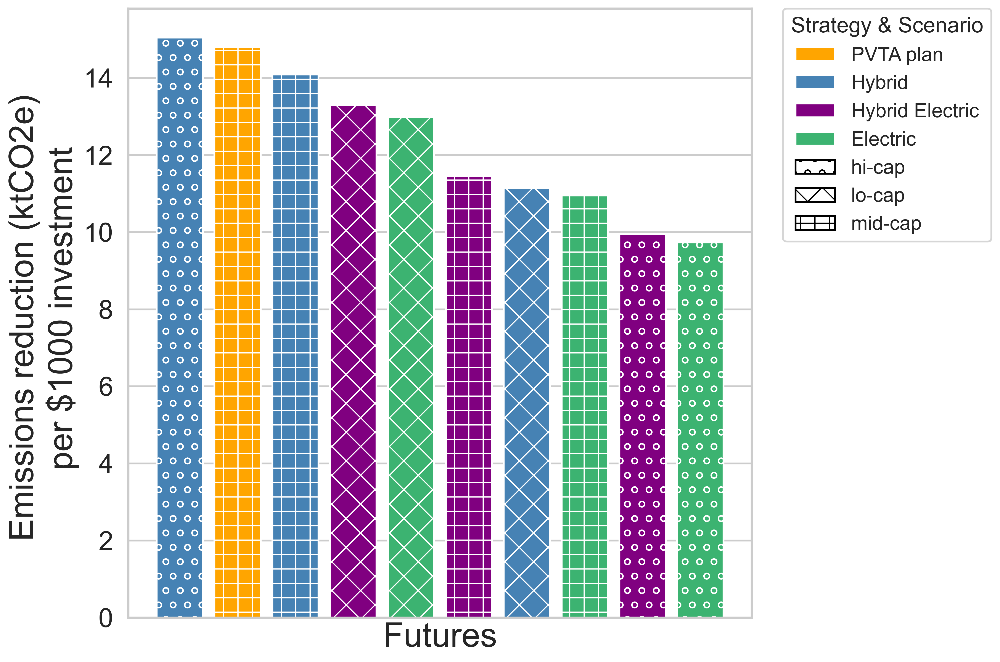

In [114]:
# Custom patterns as per user specifications
patterns_scenario = {'hi-cap': 'o', 'lo-cap': 'x', 'mid-cap': '+'}

# Sorting the DataFrame correctly
sorted_df = final_df.sort_values(by='CO2_reduction_per_$1000', ascending=False)
sorted_df = sorted_df.reset_index(drop=True)
sorted_df.rename(columns={'CO2_reduction_per_$1000': 'CO2_reduction_per_1000'}, inplace=True)


# Re-creating the custom_barplot function to use scenarios for hatches correctly
def custom_barplot(ax, data, patterns, colors):
    for i, row in enumerate(data.itertuples(), start=0):
        bar = ax.bar(i, row.CO2_reduction_per_1000, color=colors[row.Strategy])
        bar[0].set_hatch(patterns[row.Scenario])

# Re-creating the plot with the corrected modifications
plt.figure(figsize=(12, 8), dpi=400)
ax = plt.gca()
custom_barplot(ax, sorted_df, patterns_scenario, colors)

# Removing the x-axis labels and ticks
plt.xlabel('Futures', fontsize=28)
plt.xticks([])

plt.ylabel('Emissions reduction (ktCO2e) \n per $1000 investment', fontsize=28)
plt.yticks(fontsize=22)

# Correcting the custom legend for patterns and colors
legend_elements_color = [Patch(facecolor=colors[key], label=key) for key in colors.keys()]
legend_elements_pattern = [Patch(facecolor='white', edgecolor='black', hatch=patterns_scenario[key], label=key) 
                           for key in patterns_scenario.keys()]
plt.legend(handles=legend_elements_color + legend_elements_pattern, title='Strategy & Scenario', 
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.show()



In [106]:
sorted_df

,Scenario,Strategy,CO2,cumulative_cost,CO2_reduction,CO2_reduction_per_million,CO2_reduction_per_$1000,unused_fund,cost_including_redundancy
1,hi-cap,Hybrid,6.199371,99.0,1.489871,0.015049,15.049203,291.0,123.750
9,mid-cap,PVTA plan,5.894250,121.3,1.794992,0.014798,14.797953,138.7,151.625
7,mid-cap,Hybrid,6.294192,99.0,1.395050,0.014091,14.091418,161.0,123.750
5,lo-cap,Hybrid Electric,5.964648,129.6,1.724594,0.013307,13.307053,0.4,162.000
3,lo-cap,Electric,6.305632,106.6,1.383610,0.012979,12.979458,23.4,133.250
8,mid-cap,Hybrid Electric,4.770491,254.8,2.918751,0.011455,11.455067,5.2,318.500
4,lo-cap,Hybrid,6.585532,99.0,1.103710,0.011149,11.148590,31.0,123.750
6,mid-cap,Electric,5.667668,184.6,2.021574,0.010951,10.951106,75.4,230.750
2,hi-cap,Hybrid Electric,4.265183,343.9,3.424059,0.009957,9.956555,46.1,429.875
0,hi-cap,Electric,5.208574,254.8,2.480668,0.009736,9.735746,135.2,318.500
